In [45]:
%matplotlib inline

import numpy as np 
import pandas as pd
import statsmodels.api as sm
import matplotlib.pyplot as plt
import warnings
warnings.simplefilter('ignore')

from statsmodels.tsa.stattools import adfuller 
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.vector_ar.vecm import coint_johansen #Johansen Cointegration test
import datetime as dt

In [15]:
#Importing the Store Dataset
store = pd.read_csv('store.csv')
store.head()

,Store,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


In [16]:
#Importing the Train Dataset
train = pd.read_csv('train.csv')
train.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday
0,1,5,2015-07-31,5263,555,1,1,0,1
1,2,5,2015-07-31,6064,625,1,1,0,1
2,3,5,2015-07-31,8314,821,1,1,0,1
3,4,5,2015-07-31,13995,1498,1,1,0,1
4,5,5,2015-07-31,4822,559,1,1,0,1


## While the data is provided for al the stores, the objective is to forecast for the stores 1,3,8,9,13,25,29,31 and 46

In [17]:
#Making a merged dataset with all the attributes
merged_df = pd.merge(train, store, how = 'left', on = 'Store')
merged_df.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1,2,5,2015-07-31,6064,625,1,1,0,1,a,a,570.0,11.0,2007.0,1,13.0,2010.0,"Jan,Apr,Jul,Oct"
2,3,5,2015-07-31,8314,821,1,1,0,1,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3,4,5,2015-07-31,13995,1498,1,1,0,1,c,c,620.0,9.0,2009.0,0,NaN,NaN,NaN
4,5,5,2015-07-31,4822,559,1,1,0,1,a,a,29910.0,4.0,2015.0,0,NaN,NaN,NaN


In [56]:
#Stationarity Check Function
from statsmodels.tsa.stattools import adfuller
def stationary_check(sales):
  result = adfuller(sales,autolag='AIC')
  print('ADF Statistic: %f' % result[0])
  print('p-value: %f' % result[1])
  print('Critical Values:')
  for key, value in result[4].items():
    print(key, value)

In [263]:
def print_graph(x,y,label1,label2,title1):
    plt.figure(figsize=(12,5)) 
    #plt.plot( df_train['Sales'], label='Train')
    plt.plot(x, label=label1)
    plt.plot(y, label=label2)
    plt.legend(loc='best')
    plt.title(title1)
    plt.show()

## Will be building models for each of the stores, 
(1) Missing Value Treatment
(2) Checking for Stationarity
(3) Check for Co-Integration
(4) Build a VAR Model
(5) Forecast data for the next 6 weeks

### Store 1

In [164]:
store1 = merged_df[merged_df['Store']==1]
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
0,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
1115,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
2230,1,3,2015-07-29,4782,523,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
3345,1,2,2015-07-28,5011,560,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
4460,1,1,2015-07-27,6102,612,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN


In [165]:
store1['Date'] = pd.to_datetime(store1['Date'], format='%Y-%m-%d')
store1.index = store1.Date

In [166]:
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
Date,,,,,,,,,,,,,,,,,,
2015-07-31,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
2015-07-30,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
2015-07-29,1,3,2015-07-29,4782,523,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
2015-07-28,1,2,2015-07-28,5011,560,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN
2015-07-27,1,1,2015-07-27,6102,612,1,1,0,1,c,a,1270.0,9.0,2008.0,0,NaN,NaN,NaN


In [167]:
(store1.Date.max() - store1.Date.min())

Timedelta('941 days 00:00:00')

In [168]:
store1.shape

(942, 18)

In [169]:
#There are no missing days, checking for missing data
store1.isnull().sum()

Store                          0
DayOfWeek                      0
Date                           0
Sales                          0
Customers                      0
Open                           0
Promo                          0
StateHoliday                   0
SchoolHoliday                  0
StoreType                      0
Assortment                     0
CompetitionDistance            0
CompetitionOpenSinceMonth      0
CompetitionOpenSinceYear       0
Promo2                         0
Promo2SinceWeek              942
Promo2SinceYear              942
PromoInterval                942
dtype: int64

In [170]:
#As Promo 2 is 0 for Store 1, that means a second promo never existed for this Store, hence removing columns related to Promo2
store1 = store1.drop(['Promo2','Promo2SinceWeek','Promo2SinceYear','PromoInterval'], axis=1)
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
Date,,,,,,,,,,,,,,
2015-07-31,1,5,2015-07-31,5263,555,1,1,0,1,c,a,1270.0,9.0,2008.0
2015-07-30,1,4,2015-07-30,5020,546,1,1,0,1,c,a,1270.0,9.0,2008.0
2015-07-29,1,3,2015-07-29,4782,523,1,1,0,1,c,a,1270.0,9.0,2008.0
2015-07-28,1,2,2015-07-28,5011,560,1,1,0,1,c,a,1270.0,9.0,2008.0
2015-07-27,1,1,2015-07-27,6102,612,1,1,0,1,c,a,1270.0,9.0,2008.0


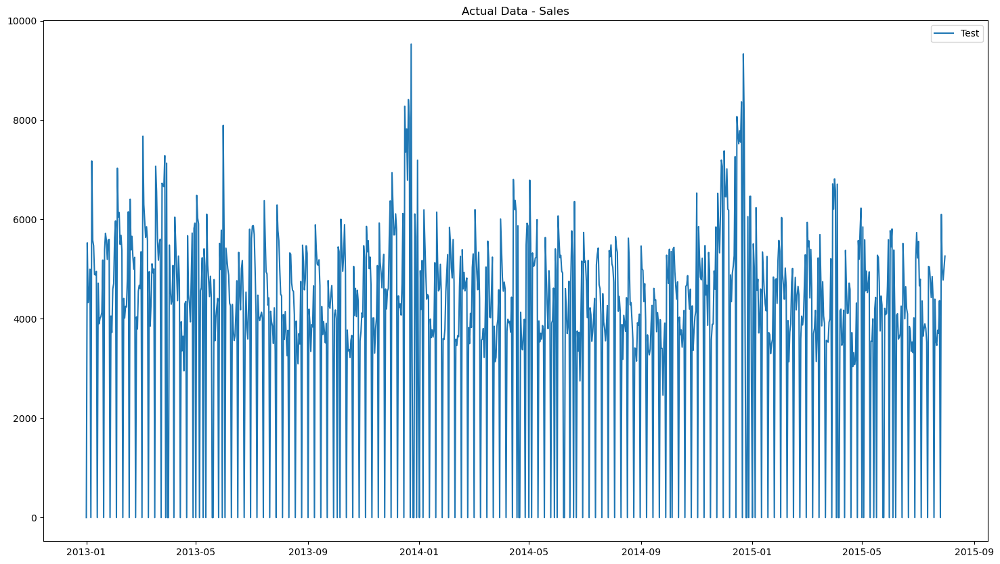

In [187]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store1['Sales'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

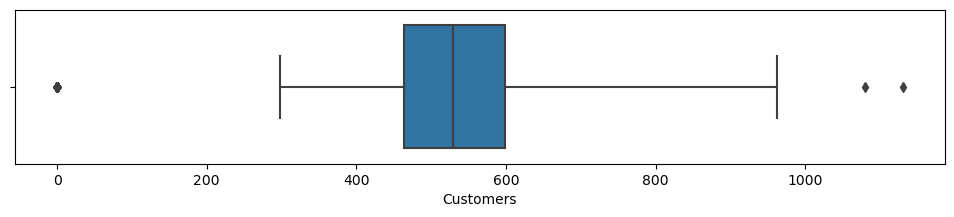

In [184]:
#Outlier Detection
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=store1['Customers'],whis=3)

##### Left hand side outliers are zero, we would want the model to capture 0s as the data is 0 here because the store was not open, this is something that the model needs to learn in order to forecast, we need to treat outliers on the right hand side which are skewed

In [176]:
store1.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
count,942.0,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.0,942.0,942.0
mean,1.0,3.997877,3945.704883,467.646497,0.829087,0.382166,0.204883,1270.0,9.0,2008.0
std,0.0,1.998404,2015.417840,228.930850,0.376633,0.486175,0.403831,0.0,0.0,0.0
min,1.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1270.0,9.0,2008.0
25%,1.0,2.000000,3588.250000,463.000000,1.000000,0.000000,0.000000,1270.0,9.0,2008.0
50%,1.0,4.000000,4373.500000,529.000000,1.000000,0.000000,0.000000,1270.0,9.0,2008.0
75%,1.0,6.000000,5220.000000,598.750000,1.000000,1.000000,0.000000,1270.0,9.0,2008.0
max,1.0,7.000000,9528.000000,1130.000000,1.000000,1.000000,1.000000,1270.0,9.0,2008.0


In [188]:
#Replacing the outliers with median values for the Sales & Customer variables, as we can see there are a handful of outliers in the above box plot
ul_sales  = np.mean(store1.Sales) + np.std(store1.Sales) * 1.5
med_sales = np.median(store1.Sales)
ul_cust = np.mean(store1.Customers) + np.std(store1.Customers) * 1.5
med_cust = np.median(store1.Customers)

In [189]:
store1['sales2'] = np.where(store1['Sales']>ul_sales,med_sales,store1['Sales'])
store1['cust2'] = np.where(store1['Customers']>ul_cust,med_cust,store1['Customers'])

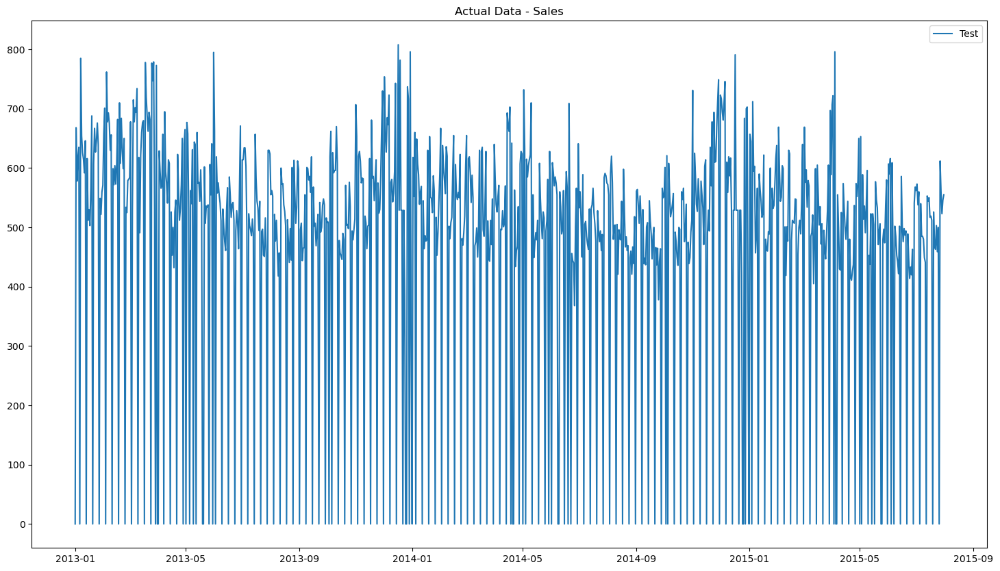

In [191]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store1['cust2'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

In [ ]:
store1['SH'] = np.where(store1['StateHoliday']==0, 0, 1)

In [192]:
stationary_check(store1['sales2'])

ADF Statistic: -5.945275
p-value: 0.000000
Critical Values:
1% -3.437485646962348
5% -2.8646901138095378
10% -2.568447319459459


In [193]:
stationary_check(store1['cust2'])

ADF Statistic: -4.213231
p-value: 0.000626
Critical Values:
1% -3.4374778690219956
5% -2.864686684217556
10% -2.5684454926748583


The p-value is very less than the significance level of 0.05 and hence we can reject the null hypothesis and consider that the series is stationary.

In [194]:
store1 = store1.sort_index(ascending = True)

In [195]:
## Split into Train & Test
test_size = 42

df_train = store1[:-test_size]
df_test = store1[-test_size:]

In [196]:
store1['SH'] = np.where(store1['StateHoliday']==0, 0, 1)

In [230]:
#Performing Scaling for the Sales & Customer Variables, Fit & Transform will be applied on the train data, and only trasnform will be applied on the Test Data
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [232]:
df_train[['sales3','cust3']] = scaler.fit_transform(df_train[['sales2','cust2']])

In [233]:
df_train.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,sales2,cust2,sales3,cust3
Date,,,,,,,,,,,,,,,,,,
2013-01-01,1,2,2013-01-01,0.0,0.0,0,0,a,1,c,a,1270.0,9.0,2008.0,0.0,0.0,0.000000,0.000000
2013-01-02,1,3,2013-01-02,5530.0,668.0,1,0,0,1,c,a,1270.0,9.0,2008.0,5530.0,668.0,0.796486,0.826733
2013-01-03,1,4,2013-01-03,4327.0,578.0,1,0,0,1,c,a,1270.0,9.0,2008.0,4327.0,578.0,0.623218,0.715347
2013-01-04,1,5,2013-01-04,4486.0,619.0,1,0,0,1,c,a,1270.0,9.0,2008.0,4486.0,619.0,0.646118,0.766089
2013-01-05,1,6,2013-01-05,4997.0,635.0,1,0,0,1,c,a,1270.0,9.0,2008.0,4997.0,635.0,0.719718,0.785891


In [234]:
df_test[['sales3','cust3']] = scaler.transform(df_test[['sales2','cust2']])

In [235]:
df_test.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,sales2,cust2,sales3,cust3
Date,,,,,,,,,,,,,,,,,,
2015-06-20,1,6,2015-06-20,4097,494,1,0,0,0,c,a,1270.0,9.0,2008.0,4097.0,494.0,0.590091,0.611386
2015-06-21,1,7,2015-06-21,0,0,0,0,0,0,c,a,1270.0,9.0,2008.0,0.0,0.0,0.000000,0.000000
2015-06-22,1,1,2015-06-22,3846,489,1,0,0,0,c,a,1270.0,9.0,2008.0,3846.0,489.0,0.553939,0.605198
2015-06-23,1,2,2015-06-23,3762,447,1,0,0,0,c,a,1270.0,9.0,2008.0,3762.0,447.0,0.541841,0.553218
2015-06-24,1,3,2015-06-24,3346,414,1,0,0,0,c,a,1270.0,9.0,2008.0,3346.0,414.0,0.481924,0.512376


In [237]:
exog = df_train[['Promo','Open','DayOfWeek']]
df_train['sales3'] = df_train['sales3'].astype('float64')
df_train['cust3'] = df_train['cust3'].astype('float64')
mod1 = sm.tsa.VARMAX(df_train[['sales3', 'cust3']], order=(1,0), trend='n', exog=exog)
res1 = mod1.fit(maxiter=1000, disp=False)
print(res1.summary())
#Note the AIC value - lower AIC => better model

                            Statespace Model Results                           
Dep. Variable:     ['sales3', 'cust3']   No. Observations:                  900
Model:                         VARX(1)   Log Likelihood                2328.392
Date:                 Wed, 22 Mar 2023   AIC                          -4630.784
Time:                         17:52:08   BIC                          -4568.353
Sample:                     01-01-2013   HQIC                         -4606.935
                          - 06-19-2015                                         
Covariance Type:                   opg                                         
Ljung-Box (L1) (Q):            82.86, 6.05   Jarque-Bera (JB):     183.60, 17704.70
Prob(Q):                        0.00, 0.01   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.03, 0.71   Skew:                       0.39, 3.24
Prob(H) (two-sided):            0.82, 0.00   Kurtosis:                  5.07, 23.74
                        

In [238]:
start_index = df_test.index.min()
end_index = df_test.index.max()
predictions = mod1.fit().predict(start=start_index, end=end_index, exog=df_test[['Promo','Open','DayOfWeek']])

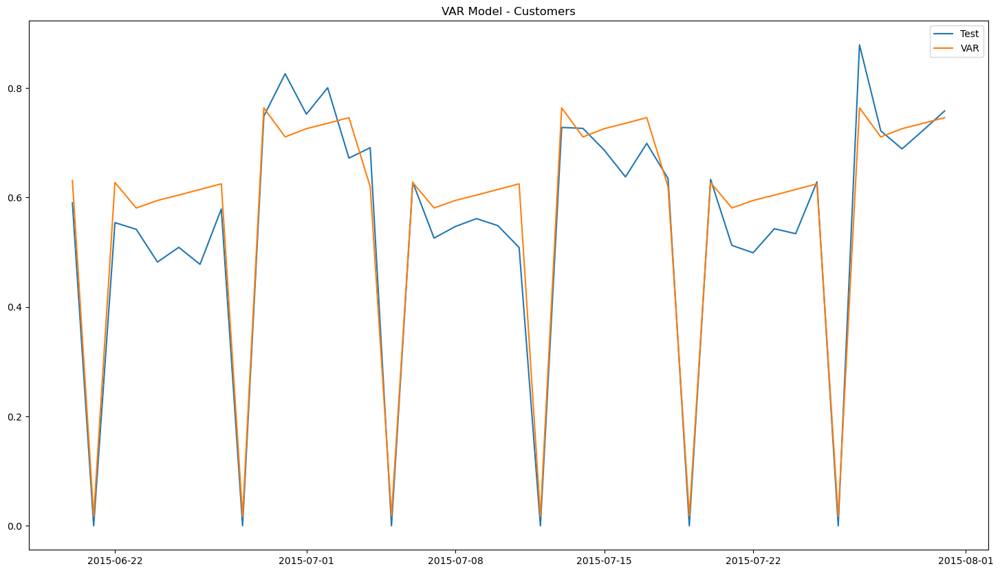

In [240]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(df_test['sales3'], label='Test')
plt.plot(predictions['sales3'], label='VAR')
plt.legend(loc='best')
plt.title('VAR Model - Customers')
plt.show()

In [248]:
output = pd.DataFrame({"Sales(Pred)":predictions['sales3'], "Customers(Pred)":predictions['cust3'],"Sales(Act)":df_test['sales3'], "Customers(Act)":df_test['cust3']})
output.head(10)

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,0.631025,0.669195,0.590091,0.611386
2015-06-21,0.017392,0.020069,0.000000,0.000000
2015-06-22,0.627352,0.667155,0.553939,0.605198
2015-06-23,0.580756,0.633657,0.541841,0.553218
2015-06-24,0.594509,0.647149,0.481924,0.512376
2015-06-25,0.604315,0.655291,0.508858,0.535891
2015-06-26,0.614614,0.663631,0.477747,0.519802
2015-06-27,0.624899,0.671915,0.578856,0.573020
2015-06-28,0.017022,0.021109,0.000000,0.000000
2015-06-29,0.763700,0.750713,0.748524,0.669554


In [249]:
col = ['Sales(Pred)','Customers(Pred)']
output[col] = scaler.inverse_transform(output[col])
output.head()

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,4381.204287,540.709874,0.590091,0.611386
2015-06-21,120.749202,16.215955,0.000000,0.000000
2015-06-22,4355.703068,539.061489,0.553939,0.605198
2015-06-23,4032.192026,511.994605,0.541841,0.553218
2015-06-24,4127.676005,522.896635,0.481924,0.512376


In [250]:
col = ['Sales(Act)','Customers(Act)']
output[col] = scaler.inverse_transform(output[col])
output.head()

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,4381.204287,540.709874,4097.0,494.0
2015-06-21,120.749202,16.215955,0.0,0.0
2015-06-22,4355.703068,539.061489,3846.0,489.0
2015-06-23,4032.192026,511.994605,3762.0,447.0
2015-06-24,4127.676005,522.896635,3346.0,414.0


In [251]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(output['Sales(Pred)'], output['Sales(Act)'])).round(2)
#print('Income: RMSE:',  rmse)

model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VAR'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(output['Customers(Pred)'], output['Customers(Act)'])).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VAR'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

In [252]:
model_comparison.reset_index(drop=True, inplace=True)
model_comparison

,Model,Variable,RMSE
0,VAR,Sales,430.49
1,VAR,Customers,53.01


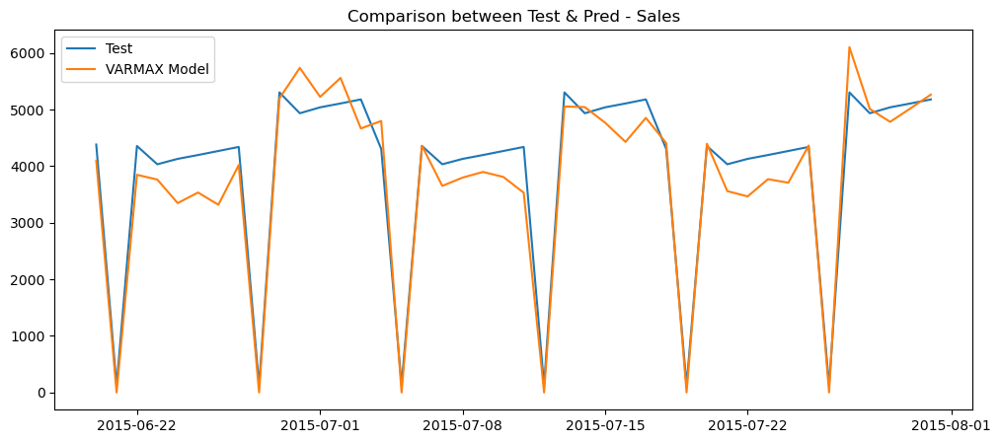

In [266]:
print_graph(output['Sales(Pred)'],output['Sales(Act)'],'Test','VARMAX Model','Comparison between Test & Pred - Sales')

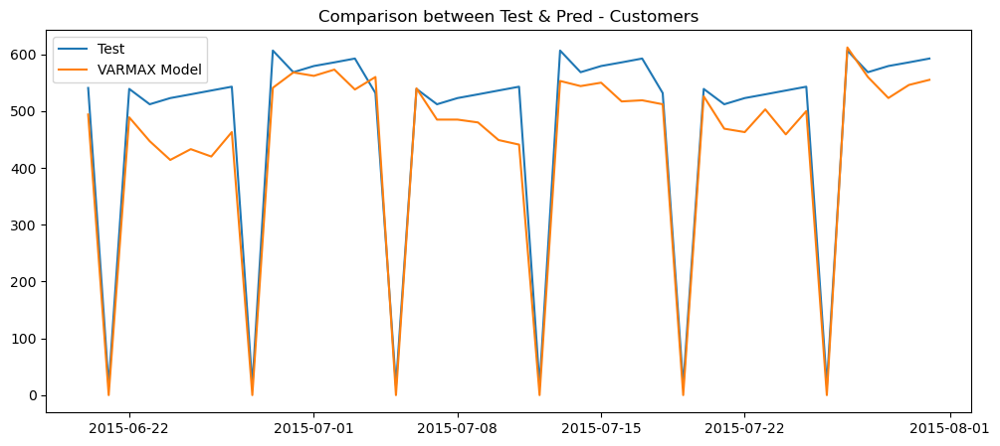

In [264]:
print_graph(output['Customers(Pred)'],output['Customers(Act)'],'Test','VARMAX Model','Comparison between Test & Pred - Customers')

#### This model can now be used to predict the Customers & Sales for the next 6 weeks by adding necessary inputs from the Store managers 

### Store 3

In [267]:
store1 = merged_df[merged_df['Store']==3]
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
2,3,5,2015-07-31,8314,821,1,1,0,1,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
1117,3,4,2015-07-30,8977,823,1,1,0,1,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
2232,3,3,2015-07-29,7610,716,1,1,0,1,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3347,3,2,2015-07-28,8864,818,1,1,0,1,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
4462,3,1,2015-07-27,8107,768,1,1,0,1,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"


In [268]:
store1['Date'] = pd.to_datetime(store1['Date'], format='%Y-%m-%d')
store1.index = store1.Date

In [269]:
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
Date,,,,,,,,,,,,,,,,,,
2015-07-31,3,5,2015-07-31,8314,821,1,1,0,1,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
2015-07-30,3,4,2015-07-30,8977,823,1,1,0,1,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
2015-07-29,3,3,2015-07-29,7610,716,1,1,0,1,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
2015-07-28,3,2,2015-07-28,8864,818,1,1,0,1,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
2015-07-27,3,1,2015-07-27,8107,768,1,1,0,1,a,a,14130.0,12.0,2006.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"


In [270]:
(store1.Date.max() - store1.Date.min())
store1.shape

(942, 18)

In [271]:
#There are no missing days, checking for missing data
store1.isnull().sum()

Store                        0
DayOfWeek                    0
Date                         0
Sales                        0
Customers                    0
Open                         0
Promo                        0
StateHoliday                 0
SchoolHoliday                0
StoreType                    0
Assortment                   0
CompetitionDistance          0
CompetitionOpenSinceMonth    0
CompetitionOpenSinceYear     0
Promo2                       0
Promo2SinceWeek              0
Promo2SinceYear              0
PromoInterval                0
dtype: int64

In [272]:
#As Promo 2 is 0 for Store 1, that means a second promo never existed for this Store, hence removing columns related to Promo2
store1 = store1.drop(['Promo2','Promo2SinceWeek','Promo2SinceYear','PromoInterval'], axis=1)
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
Date,,,,,,,,,,,,,,
2015-07-31,3,5,2015-07-31,8314,821,1,1,0,1,a,a,14130.0,12.0,2006.0
2015-07-30,3,4,2015-07-30,8977,823,1,1,0,1,a,a,14130.0,12.0,2006.0
2015-07-29,3,3,2015-07-29,7610,716,1,1,0,1,a,a,14130.0,12.0,2006.0
2015-07-28,3,2,2015-07-28,8864,818,1,1,0,1,a,a,14130.0,12.0,2006.0
2015-07-27,3,1,2015-07-27,8107,768,1,1,0,1,a,a,14130.0,12.0,2006.0


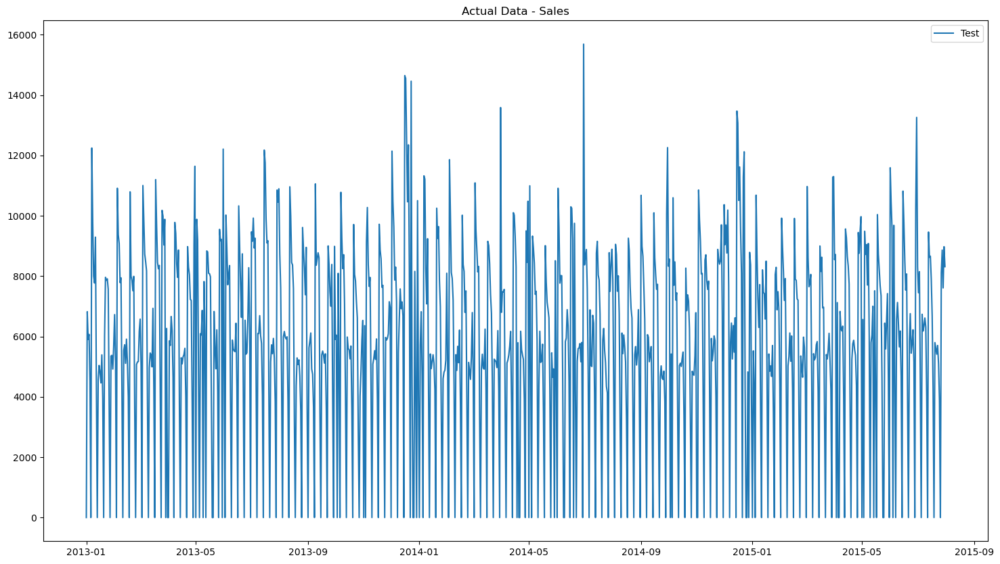

In [273]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store1['Sales'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

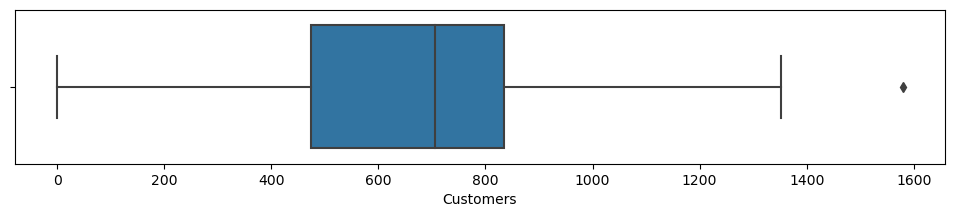

In [275]:
#Outlier Detection
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=store1['Customers'],whis=1.5)

##### Left hand side outliers are zero, we would want the model to capture 0s as the data is 0 here because the store was not open, this is something that the model needs to learn in order to forecast, we need to treat outliers on the right hand side which are skewed

In [276]:
store1.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
count,942.0,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.0,942.0,942.0
mean,3.0,3.997877,5741.253715,620.286624,0.826964,0.382166,0.180467,14130.0,12.0,2006.0
std,0.0,1.998404,3298.782559,323.366048,0.378479,0.486175,0.384780,0.0,0.0,0.0
min,3.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,14130.0,12.0,2006.0
25%,3.0,2.000000,4247.500000,475.000000,1.000000,0.000000,0.000000,14130.0,12.0,2006.0
50%,3.0,4.000000,5892.000000,705.000000,1.000000,0.000000,0.000000,14130.0,12.0,2006.0
75%,3.0,6.000000,8152.750000,834.750000,1.000000,1.000000,0.000000,14130.0,12.0,2006.0
max,3.0,7.000000,15689.000000,1579.000000,1.000000,1.000000,1.000000,14130.0,12.0,2006.0


In [277]:
#Replacing the outliers with median values for the Sales & Customer variables, as we can see there are a handful of outliers in the above box plot
ul_sales  = np.mean(store1.Sales) + np.std(store1.Sales) * 1.5
med_sales = np.median(store1.Sales)
ul_cust = np.mean(store1.Customers) + np.std(store1.Customers) * 1.5
med_cust = np.median(store1.Customers)

In [278]:
store1['sales2'] = np.where(store1['Sales']>ul_sales,med_sales,store1['Sales'])
store1['cust2'] = np.where(store1['Customers']>ul_cust,med_cust,store1['Customers'])

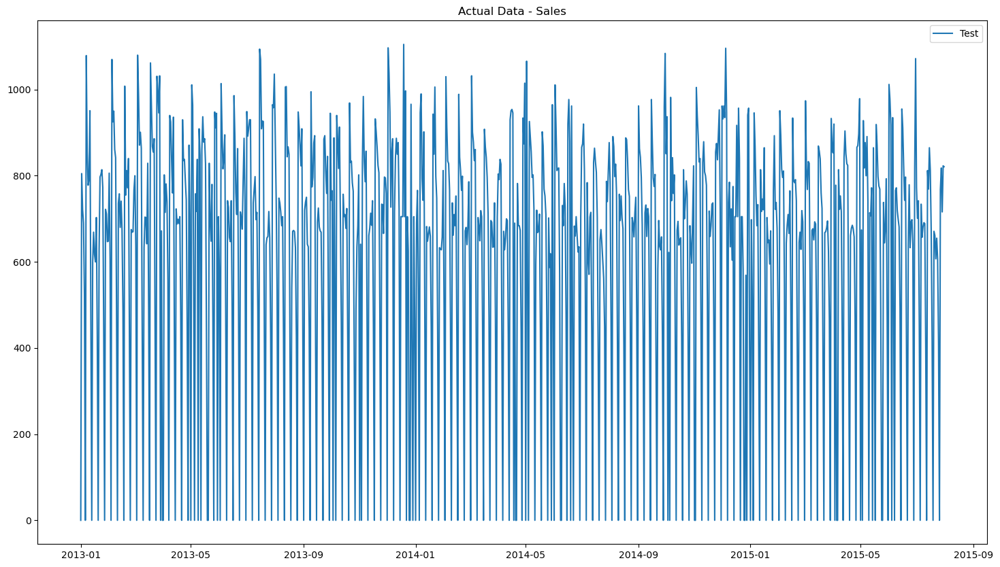

In [279]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store1['cust2'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

In [280]:
store1['SH'] = np.where(store1['StateHoliday']==0, 0, 1)

In [281]:
stationary_check(store1['sales2'])

ADF Statistic: -6.554719
p-value: 0.000000
Critical Values:
1% -3.437485646962348
5% -2.8646901138095378
10% -2.568447319459459


In [282]:
stationary_check(store1['cust2'])

ADF Statistic: -6.392933
p-value: 0.000000
Critical Values:
1% -3.437485646962348
5% -2.8646901138095378
10% -2.568447319459459


The p-value is very less than the significance level of 0.05 and hence we can reject the null hypothesis and consider that the series is stationary.

In [283]:
store1 = store1.sort_index(ascending = True)

## Split into Train & Test
test_size = 42

df_train = store1[:-test_size]
df_test = store1[-test_size:]

In [284]:
store1['SH'] = np.where(store1['StateHoliday']==0, 0, 1)

In [285]:
#Performing Scaling for the Sales & Customer Variables, Fit & Transform will be applied on the train data, and only trasnform will be applied on the Test Data
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [286]:
df_train[['sales3','cust3']] = scaler.fit_transform(df_train[['sales2','cust2']])

df_train.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,sales2,cust2,SH,sales3,cust3
Date,,,,,,,,,,,,,,,,,,,
2013-01-01,3,2,2013-01-01,0,0,0,0,a,1,a,a,14130.0,12.0,2006.0,0.0,0.0,1,0.000000,0.000000
2013-01-02,3,3,2013-01-02,6823,805,1,0,0,1,a,a,14130.0,12.0,2006.0,6823.0,805.0,1,0.638618,0.728507
2013-01-03,3,4,2013-01-03,5902,721,1,0,0,1,a,a,14130.0,12.0,2006.0,5902.0,721.0,1,0.552415,0.652489
2013-01-04,3,5,2013-01-04,6069,690,1,0,0,1,a,a,14130.0,12.0,2006.0,6069.0,690.0,1,0.568046,0.624434
2013-01-05,3,6,2013-01-05,4523,525,1,0,0,0,a,a,14130.0,12.0,2006.0,4523.0,525.0,1,0.423343,0.475113


In [287]:
df_test[['sales3','cust3']] = scaler.transform(df_test[['sales2','cust2']])

df_test.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,sales2,cust2,SH,sales3,cust3
Date,,,,,,,,,,,,,,,,,,,
2015-06-20,3,6,2015-06-20,3891,424,1,0,0,0,a,a,14130.0,12.0,2006.0,3891.0,424.0,1,0.364189,0.383710
2015-06-21,3,7,2015-06-21,0,0,0,0,0,0,a,a,14130.0,12.0,2006.0,0.0,0.0,1,0.000000,0.000000
2015-06-22,3,1,2015-06-22,5840,638,1,0,0,0,a,a,14130.0,12.0,2006.0,5840.0,638.0,1,0.546612,0.577376
2015-06-23,3,2,2015-06-23,6757,779,1,0,0,0,a,a,14130.0,12.0,2006.0,6757.0,779.0,1,0.632441,0.704977
2015-06-24,3,3,2015-06-24,5448,633,1,0,0,0,a,a,14130.0,12.0,2006.0,5448.0,633.0,1,0.509921,0.572851


In [288]:
exog = df_train[['Promo','Open','DayOfWeek']]
df_train['sales3'] = df_train['sales3'].astype('float64')
df_train['cust3'] = df_train['cust3'].astype('float64')
mod1 = sm.tsa.VARMAX(df_train[['sales3', 'cust3']], order=(1,0), trend='n', exog=exog)
res1 = mod1.fit(maxiter=1000, disp=False)
print(res1.summary())
#Note the AIC value - lower AIC => better model

                            Statespace Model Results                           
Dep. Variable:     ['sales3', 'cust3']   No. Observations:                  900
Model:                         VARX(1)   Log Likelihood                1969.521
Date:                 Wed, 22 Mar 2023   AIC                          -3913.043
Time:                         19:51:30   BIC                          -3850.612
Sample:                     01-01-2013   HQIC                         -3889.194
                          - 06-19-2015                                         
Covariance Type:                   opg                                         
Ljung-Box (L1) (Q):             4.02, 1.72   Jarque-Bera (JB):       70.69, 1661.00
Prob(Q):                        0.04, 0.19   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.96, 0.69   Skew:                      -0.23, 1.26
Prob(H) (two-sided):            0.75, 0.00   Kurtosis:                   4.30, 9.16
                        

In [289]:
start_index = df_test.index.min()
end_index = df_test.index.max()
predictions = mod1.fit().predict(start=start_index, end=end_index, exog=df_test[['Promo','Open','DayOfWeek']])

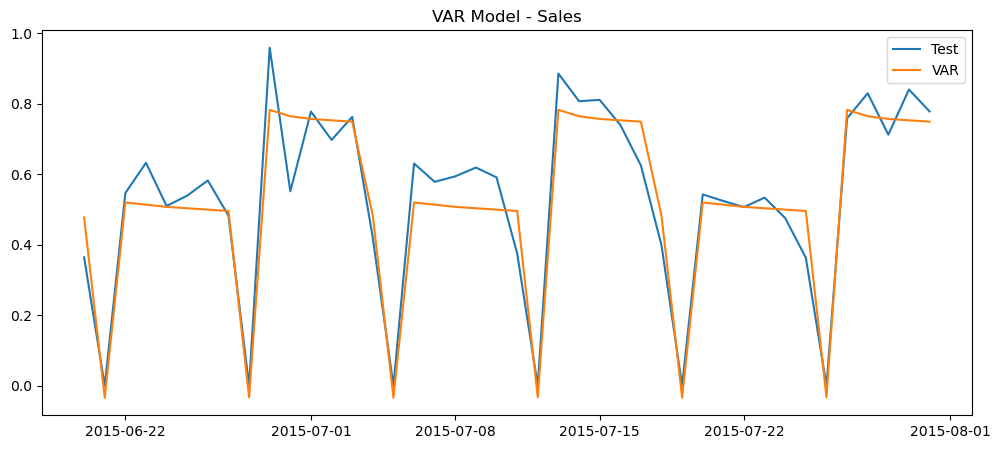

In [290]:
print_graph(df_test['sales3'], predictions['sales3'], 'Test', 'VAR', 'VAR Model - Sales')

In [291]:
output = pd.DataFrame({"Sales(Pred)":predictions['sales3'], "Customers(Pred)":predictions['cust3'],"Sales(Act)":df_test['sales3'], "Customers(Act)":df_test['cust3']})
output.head(10)

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,0.477431,0.541019,0.364189,0.383710
2015-06-21,-0.034084,-0.046374,0.000000,0.000000
2015-06-22,0.519765,0.618795,0.546612,0.577376
2015-06-23,0.513762,0.590599,0.632441,0.704977
2015-06-24,0.507430,0.584882,0.509921,0.572851
2015-06-25,0.503489,0.582670,0.539405,0.627149
2015-06-26,0.499607,0.580444,0.582366,0.631674
2015-06-27,0.495716,0.578203,0.482591,0.580090
2015-06-28,-0.032554,-0.044891,0.000000,0.000000
2015-06-29,0.782577,0.828098,0.958723,0.739367


In [292]:
col = ['Sales(Pred)','Customers(Pred)']
output[col] = scaler.inverse_transform(output[col])
output.head()

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,5100.870409,597.826350,0.364189,0.383710
2015-06-21,-364.157976,-51.243569,0.000000,0.000000
2015-06-22,5553.171104,683.768519,0.546612,0.577376
2015-06-23,5489.035487,652.611565,0.632441,0.704977
2015-06-24,5421.377490,646.294527,0.509921,0.572851


In [293]:
col = ['Sales(Act)','Customers(Act)']
output[col] = scaler.inverse_transform(output[col])
output.head()

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,5100.870409,597.826350,3891.0,424.0
2015-06-21,-364.157976,-51.243569,0.0,0.0
2015-06-22,5553.171104,683.768519,5840.0,638.0
2015-06-23,5489.035487,652.611565,6757.0,779.0
2015-06-24,5421.377490,646.294527,5448.0,633.0


In [294]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(output['Sales(Pred)'], output['Sales(Act)'])).round(2)
#print('Income: RMSE:',  rmse)

In [295]:
model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VAR'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(output['Customers(Pred)'], output['Customers(Act)'])).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VAR'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

model_comparison.reset_index(drop=True, inplace=True)
model_comparison

,Model,Variable,RMSE
0,VAR,Sales,840.21
1,VAR,Customers,100.33


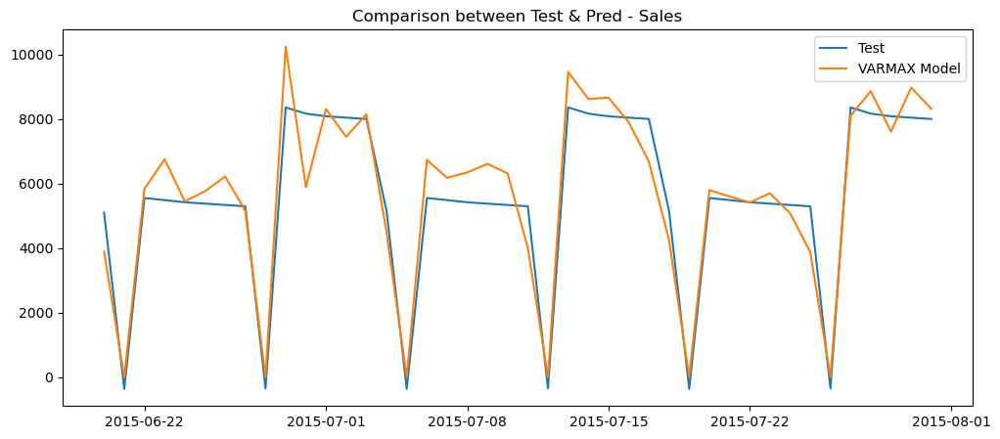

In [296]:
print_graph(output['Sales(Pred)'],output['Sales(Act)'],'Test','VARMAX Model','Comparison between Test & Pred - Sales')

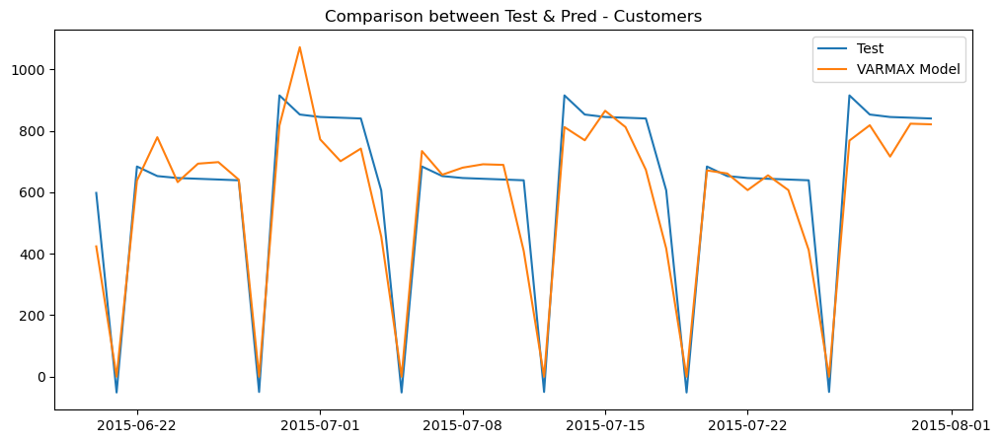

In [297]:
print_graph(output['Customers(Pred)'],output['Customers(Act)'],'Test','VARMAX Model','Comparison between Test & Pred - Customers')

### Store 8

In [298]:
store1 = merged_df[merged_df['Store']==8]
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
7,8,5,2015-07-31,8492,833,1,1,0,1,a,a,7520.0,10.0,2014.0,0,NaN,NaN,NaN
1122,8,4,2015-07-30,8420,882,1,1,0,1,a,a,7520.0,10.0,2014.0,0,NaN,NaN,NaN
2237,8,3,2015-07-29,7029,698,1,1,0,1,a,a,7520.0,10.0,2014.0,0,NaN,NaN,NaN
3352,8,2,2015-07-28,6717,695,1,1,0,1,a,a,7520.0,10.0,2014.0,0,NaN,NaN,NaN
4467,8,1,2015-07-27,8739,841,1,1,0,1,a,a,7520.0,10.0,2014.0,0,NaN,NaN,NaN


In [299]:
store1['Date'] = pd.to_datetime(store1['Date'], format='%Y-%m-%d')
store1.index = store1.Date

In [300]:
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
Date,,,,,,,,,,,,,,,,,,
2015-07-31,8,5,2015-07-31,8492,833,1,1,0,1,a,a,7520.0,10.0,2014.0,0,NaN,NaN,NaN
2015-07-30,8,4,2015-07-30,8420,882,1,1,0,1,a,a,7520.0,10.0,2014.0,0,NaN,NaN,NaN
2015-07-29,8,3,2015-07-29,7029,698,1,1,0,1,a,a,7520.0,10.0,2014.0,0,NaN,NaN,NaN
2015-07-28,8,2,2015-07-28,6717,695,1,1,0,1,a,a,7520.0,10.0,2014.0,0,NaN,NaN,NaN
2015-07-27,8,1,2015-07-27,8739,841,1,1,0,1,a,a,7520.0,10.0,2014.0,0,NaN,NaN,NaN


In [301]:
(store1.Date.max() - store1.Date.min())
store1.shape

(942, 18)

In [302]:
#There are no missing days, checking for missing data
store1.isnull().sum()

Store                          0
DayOfWeek                      0
Date                           0
Sales                          0
Customers                      0
Open                           0
Promo                          0
StateHoliday                   0
SchoolHoliday                  0
StoreType                      0
Assortment                     0
CompetitionDistance            0
CompetitionOpenSinceMonth      0
CompetitionOpenSinceYear       0
Promo2                         0
Promo2SinceWeek              942
Promo2SinceYear              942
PromoInterval                942
dtype: int64

In [303]:
#As Promo 2 is 0 for Store 1, that means a second promo never existed for this Store, hence removing columns related to Promo2
store1 = store1.drop(['Promo2','Promo2SinceWeek','Promo2SinceYear','PromoInterval'], axis=1)
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
Date,,,,,,,,,,,,,,
2015-07-31,8,5,2015-07-31,8492,833,1,1,0,1,a,a,7520.0,10.0,2014.0
2015-07-30,8,4,2015-07-30,8420,882,1,1,0,1,a,a,7520.0,10.0,2014.0
2015-07-29,8,3,2015-07-29,7029,698,1,1,0,1,a,a,7520.0,10.0,2014.0
2015-07-28,8,2,2015-07-28,6717,695,1,1,0,1,a,a,7520.0,10.0,2014.0
2015-07-27,8,1,2015-07-27,8739,841,1,1,0,1,a,a,7520.0,10.0,2014.0


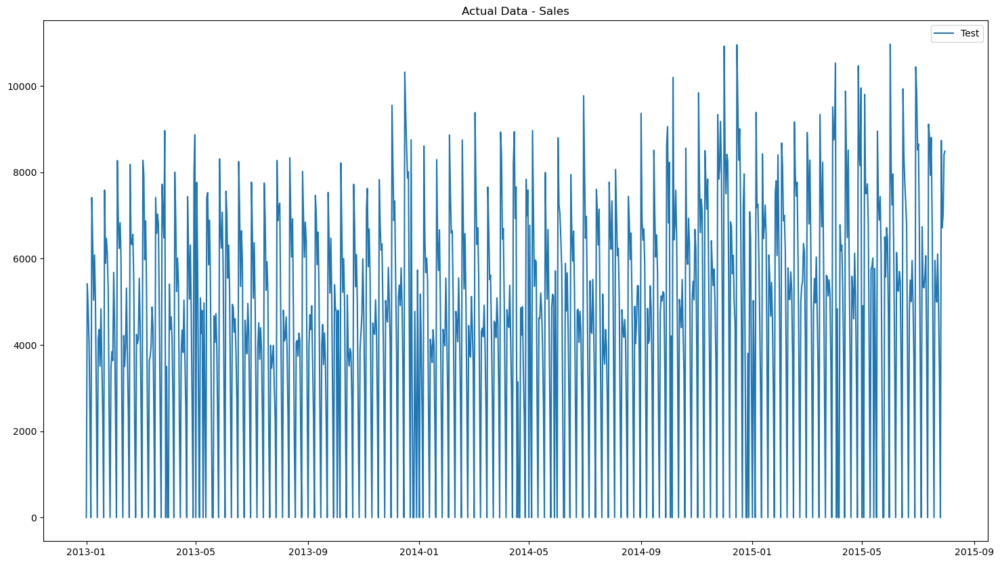

In [304]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store1['Sales'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

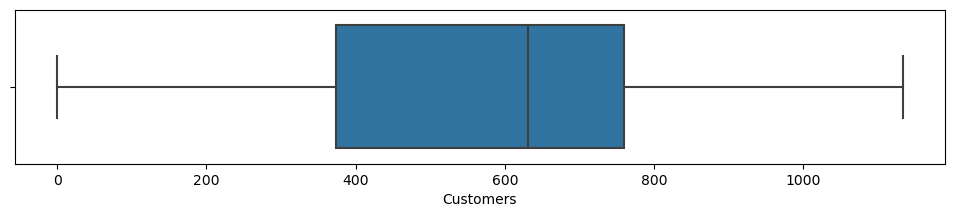

In [305]:
#Outlier Detection
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=store1['Customers'],whis=1.5)

##### Left hand side outliers are zero, we would want the model to capture 0s as the data is 0 here because the store was not open, this is something that the model needs to learn in order to forecast, we need to treat outliers on the right hand side which are skewed

In [306]:
store1.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
count,942.0,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.0,942.0,942.0
mean,8.0,3.997877,4610.251592,547.799363,0.832272,0.382166,0.168790,7520.0,10.0,2014.0
std,0.0,1.998404,2696.883772,293.404732,0.373823,0.486175,0.374765,0.0,0.0,0.0
min,8.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,7520.0,10.0,2014.0
25%,8.0,2.000000,2916.750000,374.250000,1.000000,0.000000,0.000000,7520.0,10.0,2014.0
50%,8.0,4.000000,4919.000000,630.500000,1.000000,0.000000,0.000000,7520.0,10.0,2014.0
75%,8.0,6.000000,6558.000000,759.750000,1.000000,1.000000,0.000000,7520.0,10.0,2014.0
max,8.0,7.000000,10971.000000,1133.000000,1.000000,1.000000,1.000000,7520.0,10.0,2014.0


In [307]:
#Replacing the outliers with median values for the Sales & Customer variables, as we can see there are a handful of outliers in the above box plot
ul_sales  = np.mean(store1.Sales) + np.std(store1.Sales) * 1.5
med_sales = np.median(store1.Sales)
ul_cust = np.mean(store1.Customers) + np.std(store1.Customers) * 1.5
med_cust = np.median(store1.Customers)

In [308]:
store1['sales2'] = np.where(store1['Sales']>ul_sales,med_sales,store1['Sales'])
store1['cust2'] = np.where(store1['Customers']>ul_cust,med_cust,store1['Customers'])

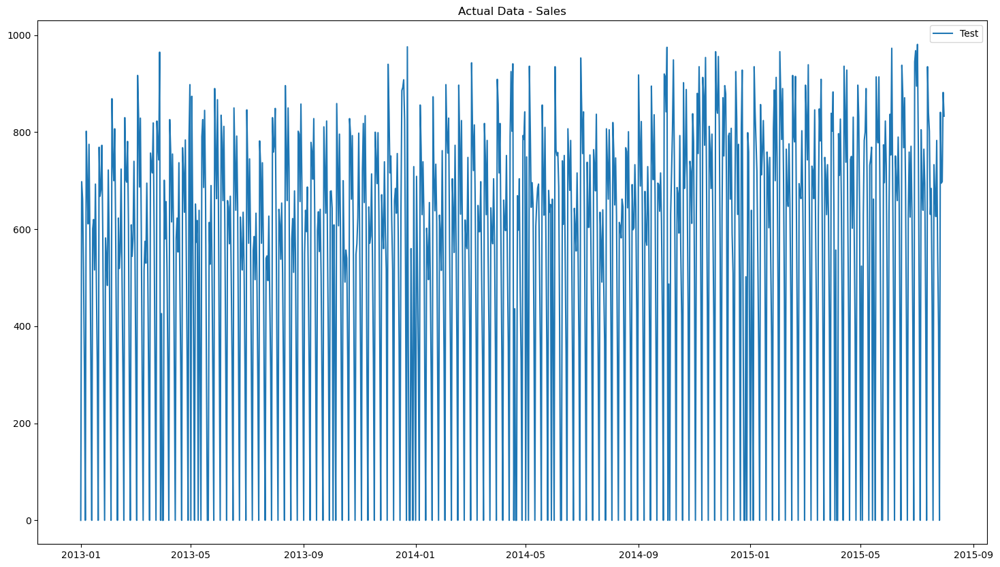

In [309]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store1['cust2'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

In [310]:
store1['SH'] = np.where(store1['StateHoliday']==0, 0, 1)

In [311]:
stationary_check(store1['sales2'])

ADF Statistic: -4.660008
p-value: 0.000100
Critical Values:
1% -3.437485646962348
5% -2.8646901138095378
10% -2.568447319459459


In [312]:
stationary_check(store1['cust2'])

ADF Statistic: -4.151851
p-value: 0.000794
Critical Values:
1% -3.4374778690219956
5% -2.864686684217556
10% -2.5684454926748583


The p-value is very less than the significance level of 0.05 and hence we can reject the null hypothesis and consider that the series is stationary.

In [313]:
store1 = store1.sort_index(ascending = True)

## Split into Train & Test
test_size = 42

df_train = store1[:-test_size]
df_test = store1[-test_size:]

In [314]:
store1['SH'] = np.where(store1['StateHoliday']==0, 0, 1)

In [315]:
#Performing Scaling for the Sales & Customer Variables, Fit & Transform will be applied on the train data, and only trasnform will be applied on the Test Data
scaler = MinMaxScaler()

In [316]:
df_train[['sales3','cust3']] = scaler.fit_transform(df_train[['sales2','cust2']])

df_train.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,sales2,cust2,SH,sales3,cust3
Date,,,,,,,,,,,,,,,,,,,
2013-01-01,8,2,2013-01-01,0,0,0,0,a,1,a,a,7520.0,10.0,2014.0,0.0,0.0,1,0.000000,0.000000
2013-01-02,8,3,2013-01-02,5419,698,1,0,0,1,a,a,7520.0,10.0,2014.0,5419.0,698.0,1,0.627926,0.715164
2013-01-03,8,4,2013-01-03,4842,662,1,0,0,1,a,a,7520.0,10.0,2014.0,4842.0,662.0,1,0.561066,0.678279
2013-01-04,8,5,2013-01-04,4059,517,1,0,0,1,a,a,7520.0,10.0,2014.0,4059.0,517.0,1,0.470336,0.529713
2013-01-05,8,6,2013-01-05,2337,312,1,0,0,0,a,a,7520.0,10.0,2014.0,2337.0,312.0,1,0.270800,0.319672


In [317]:
df_test[['sales3','cust3']] = scaler.transform(df_test[['sales2','cust2']])

df_test.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,sales2,cust2,SH,sales3,cust3
Date,,,,,,,,,,,,,,,,,,,
2015-06-20,8,6,2015-06-20,3611,409,1,0,0,0,a,a,7520.0,10.0,2014.0,3611.0,409.0,1,0.418424,0.419057
2015-06-21,8,7,2015-06-21,0,0,0,0,0,0,a,a,7520.0,10.0,2014.0,0.0,0.0,1,0.000000,0.000000
2015-06-22,8,1,2015-06-22,4796,630,1,0,0,0,a,a,7520.0,10.0,2014.0,4796.0,630.0,1,0.555736,0.645492
2015-06-23,8,2,2015-06-23,5501,759,1,0,0,0,a,a,7520.0,10.0,2014.0,5501.0,759.0,1,0.637428,0.777664
2015-06-24,8,3,2015-06-24,5005,625,1,0,0,0,a,a,7520.0,10.0,2014.0,5005.0,625.0,1,0.579954,0.640369


In [318]:
exog = df_train[['Promo','Open','DayOfWeek']]
df_train['sales3'] = df_train['sales3'].astype('float64')
df_train['cust3'] = df_train['cust3'].astype('float64')
mod1 = sm.tsa.VARMAX(df_train[['sales3', 'cust3']], order=(1,0), trend='n', exog=exog)
res1 = mod1.fit(maxiter=1000, disp=False)
print(res1.summary())
#Note the AIC value - lower AIC => better model

                            Statespace Model Results                           
Dep. Variable:     ['sales3', 'cust3']   No. Observations:                  900
Model:                         VARX(1)   Log Likelihood                1712.717
Date:                 Wed, 22 Mar 2023   AIC                          -3399.434
Time:                         20:02:18   BIC                          -3337.003
Sample:                     01-01-2013   HQIC                         -3375.585
                          - 06-19-2015                                         
Covariance Type:                   opg                                         
Ljung-Box (L1) (Q):            14.53, 4.35   Jarque-Bera (JB):        9.69, 1545.19
Prob(Q):                        0.00, 0.04   Prob(JB):                   0.01, 0.00
Heteroskedasticity (H):         1.43, 1.77   Skew:                      -0.24, 1.63
Prob(H) (two-sided):            0.00, 0.00   Kurtosis:                   2.86, 8.52
                        

In [319]:
start_index = df_test.index.min()
end_index = df_test.index.max()
predictions = mod1.fit().predict(start=start_index, end=end_index, exog=df_test[['Promo','Open','DayOfWeek']])

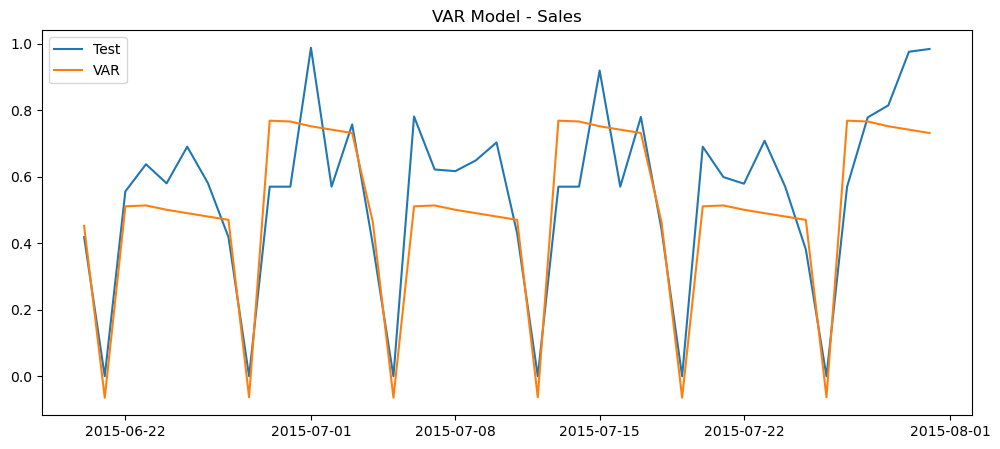

In [320]:
print_graph(df_test['sales3'], predictions['sales3'], 'Test', 'VAR', 'VAR Model - Sales')

In [321]:
output = pd.DataFrame({"Sales(Pred)":predictions['sales3'], "Customers(Pred)":predictions['cust3'],"Sales(Act)":df_test['sales3'], "Customers(Act)":df_test['cust3']})
output.head(10)

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,0.452135,0.515716,0.418424,0.419057
2015-06-21,-0.064759,-0.082895,0.000000,0.000000
2015-06-22,0.510959,0.612026,0.555736,0.645492
2015-06-23,0.513510,0.590061,0.637428,0.777664
2015-06-24,0.500537,0.576980,0.579954,0.640369
2015-06-25,0.490345,0.567591,0.690151,0.789959
2015-06-26,0.480253,0.558185,0.581228,0.654713
2015-06-27,0.470148,0.548761,0.418424,0.406762
2015-06-28,-0.063082,-0.081891,0.000000,0.000000
2015-06-29,0.768440,0.826616,0.569988,0.968238


In [322]:
col = ['Sales(Pred)','Customers(Pred)']
output[col] = scaler.inverse_transform(output[col])
output.head()

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,3901.925289,503.339004,0.418424,0.419057
2015-06-21,-558.874096,-80.905643,0.000000,0.000000
2015-06-22,4409.580121,597.337831,0.555736,0.645492
2015-06-23,4431.588467,575.900018,0.637428,0.777664
2015-06-24,4319.636144,563.132082,0.579954,0.640369


In [323]:
col = ['Sales(Act)','Customers(Act)']
output[col] = scaler.inverse_transform(output[col])
output.head()

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,3901.925289,503.339004,3611.0,409.0
2015-06-21,-558.874096,-80.905643,0.0,0.0
2015-06-22,4409.580121,597.337831,4796.0,630.0
2015-06-23,4431.588467,575.900018,5501.0,759.0
2015-06-24,4319.636144,563.132082,5005.0,625.0


In [324]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(output['Sales(Pred)'], output['Sales(Act)'])).round(2)
#print('Income: RMSE:',  rmse)

In [325]:
model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VAR'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(output['Customers(Pred)'], output['Customers(Act)'])).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VAR'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

model_comparison.reset_index(drop=True, inplace=True)
model_comparison

,Model,Variable,RMSE
0,VAR,Sales,1230.46
1,VAR,Customers,122.36


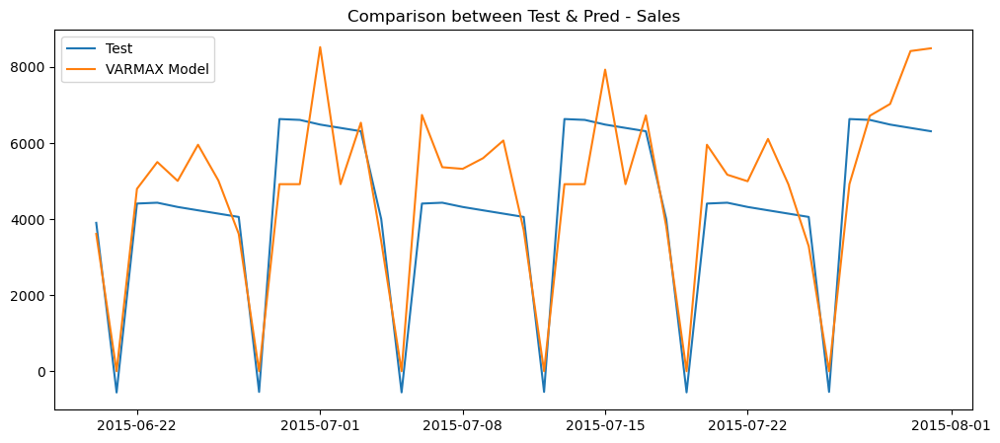

In [326]:
print_graph(output['Sales(Pred)'],output['Sales(Act)'],'Test','VARMAX Model','Comparison between Test & Pred - Sales')

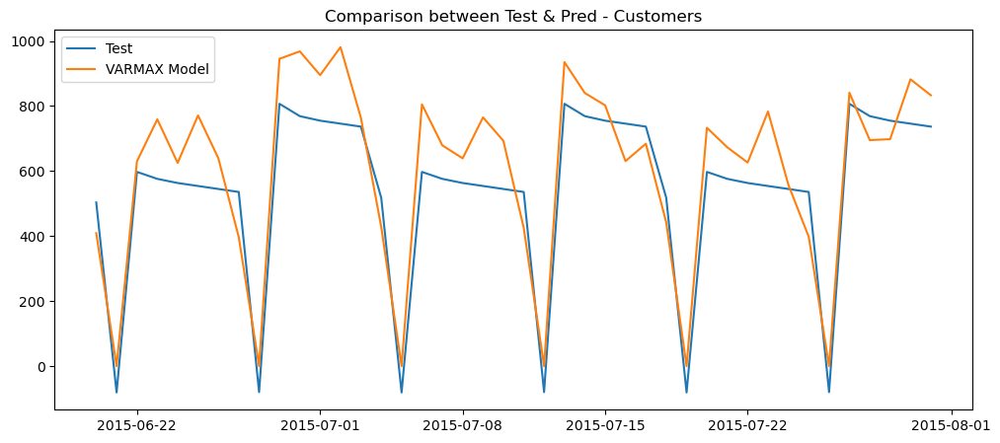

In [327]:
print_graph(output['Customers(Pred)'],output['Customers(Act)'],'Test','VARMAX Model','Comparison between Test & Pred - Customers')

### Store 9

In [328]:
store1 = merged_df[merged_df['Store']==9]
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
8,9,5,2015-07-31,8565,687,1,1,0,1,a,c,2030.0,8.0,2000.0,0,NaN,NaN,NaN
1123,9,4,2015-07-30,7539,651,1,1,0,1,a,c,2030.0,8.0,2000.0,0,NaN,NaN,NaN
2238,9,3,2015-07-29,7776,625,1,1,0,1,a,c,2030.0,8.0,2000.0,0,NaN,NaN,NaN
3353,9,2,2015-07-28,8751,678,1,1,0,1,a,c,2030.0,8.0,2000.0,0,NaN,NaN,NaN
4468,9,1,2015-07-27,10649,777,1,1,0,1,a,c,2030.0,8.0,2000.0,0,NaN,NaN,NaN


In [329]:
store1['Date'] = pd.to_datetime(store1['Date'], format='%Y-%m-%d')
store1.index = store1.Date

In [330]:
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
Date,,,,,,,,,,,,,,,,,,
2015-07-31,9,5,2015-07-31,8565,687,1,1,0,1,a,c,2030.0,8.0,2000.0,0,NaN,NaN,NaN
2015-07-30,9,4,2015-07-30,7539,651,1,1,0,1,a,c,2030.0,8.0,2000.0,0,NaN,NaN,NaN
2015-07-29,9,3,2015-07-29,7776,625,1,1,0,1,a,c,2030.0,8.0,2000.0,0,NaN,NaN,NaN
2015-07-28,9,2,2015-07-28,8751,678,1,1,0,1,a,c,2030.0,8.0,2000.0,0,NaN,NaN,NaN
2015-07-27,9,1,2015-07-27,10649,777,1,1,0,1,a,c,2030.0,8.0,2000.0,0,NaN,NaN,NaN


In [331]:
(store1.Date.max() - store1.Date.min())
store1.shape

(942, 18)

In [332]:
#There are no missing days, checking for missing data
store1.isnull().sum()

Store                          0
DayOfWeek                      0
Date                           0
Sales                          0
Customers                      0
Open                           0
Promo                          0
StateHoliday                   0
SchoolHoliday                  0
StoreType                      0
Assortment                     0
CompetitionDistance            0
CompetitionOpenSinceMonth      0
CompetitionOpenSinceYear       0
Promo2                         0
Promo2SinceWeek              942
Promo2SinceYear              942
PromoInterval                942
dtype: int64

In [333]:
#As Promo 2 is 0 for Store 1, that means a second promo never existed for this Store, hence removing columns related to Promo2
store1 = store1.drop(['Promo2','Promo2SinceWeek','Promo2SinceYear','PromoInterval'], axis=1)
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
Date,,,,,,,,,,,,,,
2015-07-31,9,5,2015-07-31,8565,687,1,1,0,1,a,c,2030.0,8.0,2000.0
2015-07-30,9,4,2015-07-30,7539,651,1,1,0,1,a,c,2030.0,8.0,2000.0
2015-07-29,9,3,2015-07-29,7776,625,1,1,0,1,a,c,2030.0,8.0,2000.0
2015-07-28,9,2,2015-07-28,8751,678,1,1,0,1,a,c,2030.0,8.0,2000.0
2015-07-27,9,1,2015-07-27,10649,777,1,1,0,1,a,c,2030.0,8.0,2000.0


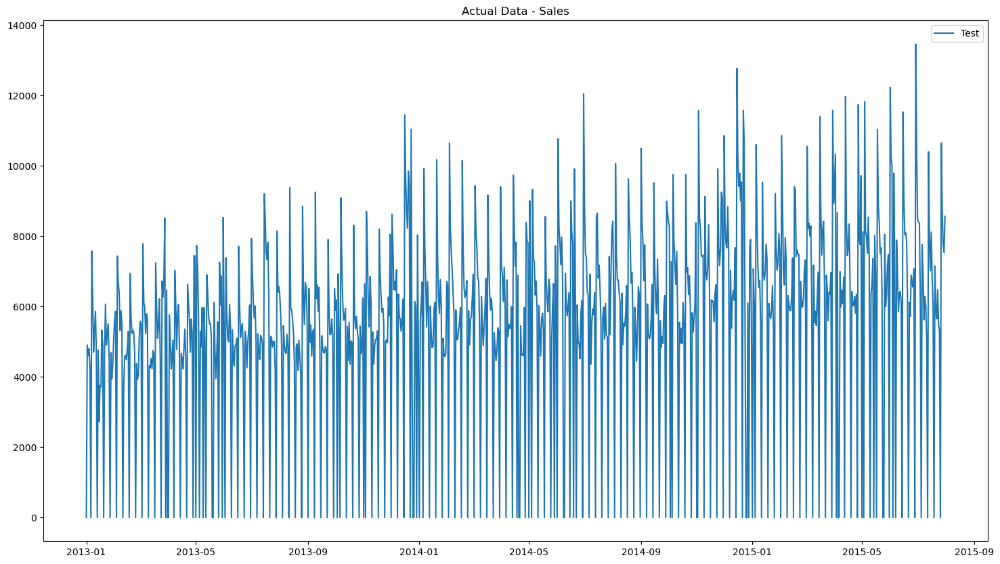

In [334]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store1['Sales'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

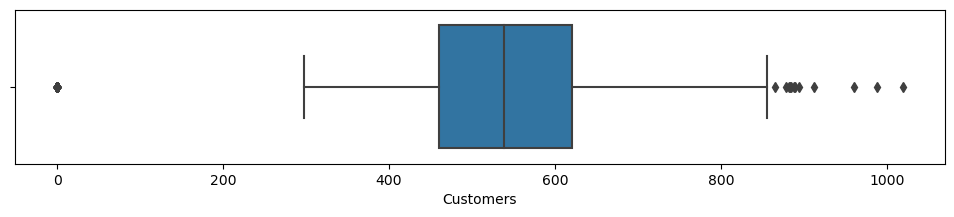

In [335]:
#Outlier Detection
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=store1['Customers'],whis=1.5)

##### Left hand side outliers are zero, we would want the model to capture 0s as the data is 0 here because the store was not open, this is something that the model needs to learn in order to forecast, we need to treat outliers on the right hand side which are skewed

In [336]:
store1.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
count,942.0,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.0,942.0,942.0
mean,9.0,3.997877,5426.816348,479.487261,0.826964,0.382166,0.180467,2030.0,8.0,2000.0
std,0.0,1.998404,2891.687966,238.656876,0.378479,0.486175,0.384780,0.0,0.0,0.0
min,9.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2030.0,8.0,2000.0
25%,9.0,2.000000,4765.500000,460.500000,1.000000,0.000000,0.000000,2030.0,8.0,2000.0
50%,9.0,4.000000,5904.500000,539.000000,1.000000,0.000000,0.000000,2030.0,8.0,2000.0
75%,9.0,6.000000,7086.750000,620.750000,1.000000,1.000000,0.000000,2030.0,8.0,2000.0
max,9.0,7.000000,13457.000000,1019.000000,1.000000,1.000000,1.000000,2030.0,8.0,2000.0


In [337]:
#Replacing the outliers with median values for the Sales & Customer variables, as we can see there are a handful of outliers in the above box plot
ul_sales  = np.mean(store1.Sales) + np.std(store1.Sales) * 1.5
med_sales = np.median(store1.Sales)
ul_cust = np.mean(store1.Customers) + np.std(store1.Customers) * 1.5
med_cust = np.median(store1.Customers)

In [338]:
store1['sales2'] = np.where(store1['Sales']>ul_sales,med_sales,store1['Sales'])
store1['cust2'] = np.where(store1['Customers']>ul_cust,med_cust,store1['Customers'])

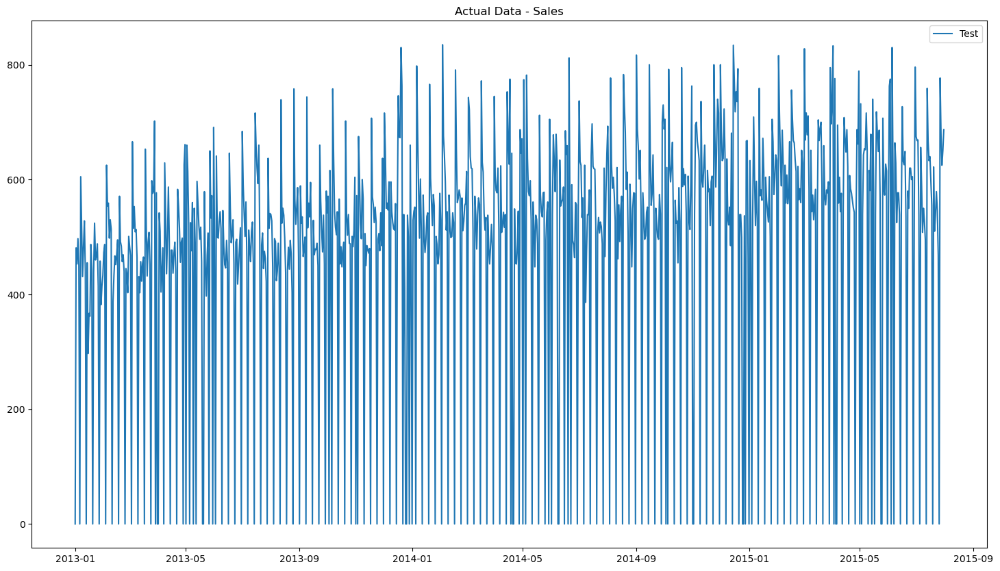

In [339]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store1['cust2'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

In [340]:
store1['SH'] = np.where(store1['StateHoliday']==0, 0, 1)

In [341]:
stationary_check(store1['sales2'])

ADF Statistic: -3.297010
p-value: 0.015013
Critical Values:
1% -3.437485646962348
5% -2.8646901138095378
10% -2.568447319459459


In [342]:
stationary_check(store1['cust2'])

ADF Statistic: -2.906154
p-value: 0.044637
Critical Values:
1% -3.437485646962348
5% -2.8646901138095378
10% -2.568447319459459


The p-value is very less than the significance level of 0.05 and hence we can reject the null hypothesis and consider that the series is stationary.

In [343]:
store1 = store1.sort_index(ascending = True)

## Split into Train & Test
test_size = 42

df_train = store1[:-test_size]
df_test = store1[-test_size:]

In [344]:
store1['SH'] = np.where(store1['StateHoliday']==0, 0, 1)

In [345]:
#Performing Scaling for the Sales & Customer Variables, Fit & Transform will be applied on the train data, and only trasnform will be applied on the Test Data
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [346]:
df_train[['sales3','cust3']] = scaler.fit_transform(df_train[['sales2','cust2']])

df_train.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,sales2,cust2,SH,sales3,cust3
Date,,,,,,,,,,,,,,,,,,,
2013-01-01,9,2,2013-01-01,0,0,0,0,a,1,a,c,2030.0,8.0,2000.0,0.0,0.0,1,0.000000,0.000000
2013-01-02,9,3,2013-01-02,4903,481,1,0,0,1,a,c,2030.0,8.0,2000.0,4903.0,481.0,1,0.502666,0.576048
2013-01-03,9,4,2013-01-03,4602,453,1,0,0,1,a,c,2030.0,8.0,2000.0,4602.0,453.0,1,0.471806,0.542515
2013-01-04,9,5,2013-01-04,4798,497,1,0,0,1,a,c,2030.0,8.0,2000.0,4798.0,497.0,1,0.491901,0.595210
2013-01-05,9,6,2013-01-05,4254,450,1,0,0,0,a,c,2030.0,8.0,2000.0,4254.0,450.0,1,0.436129,0.538922


In [347]:
df_test[['sales3','cust3']] = scaler.transform(df_test[['sales2','cust2']])

df_test.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,sales2,cust2,SH,sales3,cust3
Date,,,,,,,,,,,,,,,,,,,
2015-06-20,9,6,2015-06-20,6179,536,1,0,0,0,a,c,2030.0,8.0,2000.0,6179.0,536.0,1,0.633484,0.641916
2015-06-21,9,7,2015-06-21,0,0,0,0,0,0,a,c,2030.0,8.0,2000.0,0.0,0.0,1,0.000000,0.000000
2015-06-22,9,1,2015-06-22,6121,580,1,0,0,0,a,c,2030.0,8.0,2000.0,6121.0,580.0,1,0.627537,0.694611
2015-06-23,9,2,2015-06-23,5714,550,1,0,0,0,a,c,2030.0,8.0,2000.0,5714.0,550.0,1,0.585811,0.658683
2015-06-24,9,3,2015-06-24,6888,620,1,0,0,0,a,c,2030.0,8.0,2000.0,6888.0,620.0,1,0.706172,0.742515


In [348]:
exog = df_train[['Promo','Open','DayOfWeek']]
df_train['sales3'] = df_train['sales3'].astype('float64')
df_train['cust3'] = df_train['cust3'].astype('float64')
mod1 = sm.tsa.VARMAX(df_train[['sales3', 'cust3']], order=(1,0), trend='n', exog=exog)
res1 = mod1.fit(maxiter=1000, disp=False)
print(res1.summary())
#Note the AIC value - lower AIC => better model

                            Statespace Model Results                           
Dep. Variable:     ['sales3', 'cust3']   No. Observations:                  900
Model:                         VARX(1)   Log Likelihood                2137.997
Date:                 Wed, 22 Mar 2023   AIC                          -4249.993
Time:                         20:21:29   BIC                          -4187.562
Sample:                     01-01-2013   HQIC                         -4226.144
                          - 06-19-2015                                         
Covariance Type:                   opg                                         
Ljung-Box (L1) (Q):           90.18, 14.55   Jarque-Bera (JB):      89.87, 13303.68
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.07, 3.68   Skew:                       0.32, 3.35
Prob(H) (two-sided):            0.58, 0.00   Kurtosis:                  4.41, 20.60
                        

In [349]:
start_index = df_test.index.min()
end_index = df_test.index.max()
predictions = mod1.fit().predict(start=start_index, end=end_index, exog=df_test[['Promo','Open','DayOfWeek']])

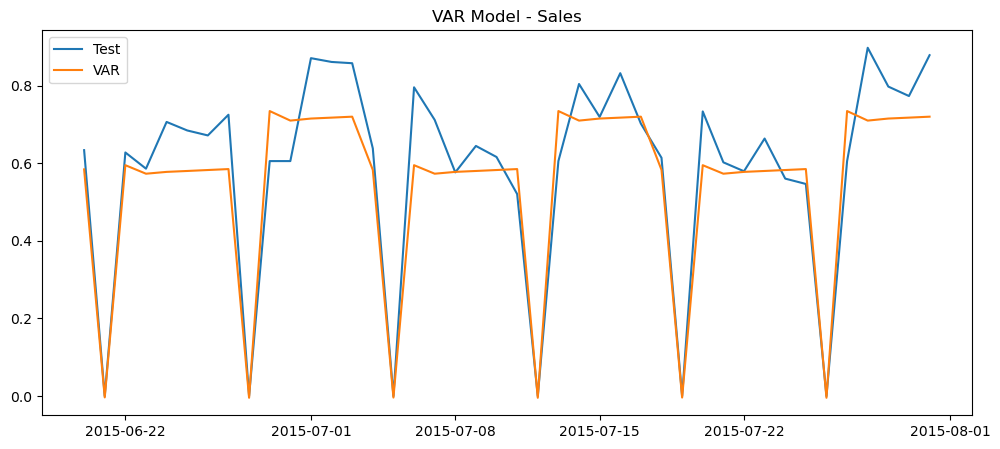

In [350]:
print_graph(df_test['sales3'], predictions['sales3'], 'Test', 'VAR', 'VAR Model - Sales')

In [351]:
output = pd.DataFrame({"Sales(Pred)":predictions['sales3'], "Customers(Pred)":predictions['cust3'],"Sales(Act)":df_test['sales3'], "Customers(Act)":df_test['cust3']})
output.head(10)

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,0.583961,0.623628,0.633484,0.641916
2015-06-21,-0.003292,-0.009826,0.000000,0.000000
2015-06-22,0.594759,0.655408,0.627537,0.694611
2015-06-23,0.572833,0.617201,0.585811,0.658683
2015-06-24,0.577520,0.623643,0.706172,0.742515
2015-06-25,0.579883,0.627687,0.684232,0.742515
2015-06-26,0.582325,0.631891,0.671417,0.718563
2015-06-27,0.584759,0.636086,0.724728,0.724551
2015-06-28,-0.004271,-0.010267,0.000000,0.000000
2015-06-29,0.734192,0.772852,0.605341,0.645509


In [352]:
col = ['Sales(Pred)','Customers(Pred)']
output[col] = scaler.inverse_transform(output[col])
output.head()

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,5695.958155,520.729505,0.633484,0.641916
2015-06-21,-32.109295,-8.204333,0.000000,0.000000
2015-06-22,5801.280090,547.266054,0.627537,0.694611
2015-06-23,5587.415107,515.363184,0.585811,0.658683
2015-06-24,5633.132243,520.741728,0.706172,0.742515


In [353]:
col = ['Sales(Act)','Customers(Act)']
output[col] = scaler.inverse_transform(output[col])
output.head()

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,5695.958155,520.729505,6179.0,536.0
2015-06-21,-32.109295,-8.204333,0.0,0.0
2015-06-22,5801.280090,547.266054,6121.0,580.0
2015-06-23,5587.415107,515.363184,5714.0,550.0
2015-06-24,5633.132243,520.741728,6888.0,620.0


In [354]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(output['Sales(Pred)'], output['Sales(Act)'])).round(2)
#print('Income: RMSE:',  rmse)

In [355]:
model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VAR'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(output['Customers(Pred)'], output['Customers(Act)'])).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VAR'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

model_comparison.reset_index(drop=True, inplace=True)
model_comparison

,Model,Variable,RMSE
0,VAR,Sales,924.76
1,VAR,Customers,63.57


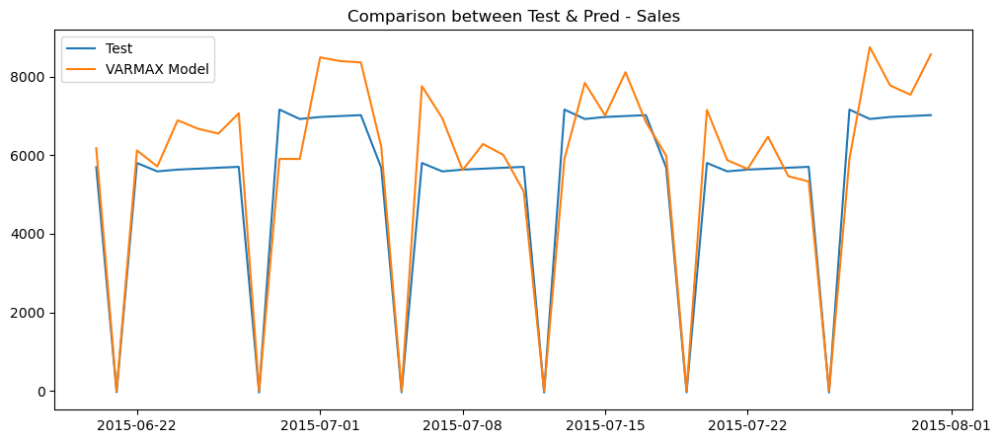

In [356]:
print_graph(output['Sales(Pred)'],output['Sales(Act)'],'Test','VARMAX Model','Comparison between Test & Pred - Sales')

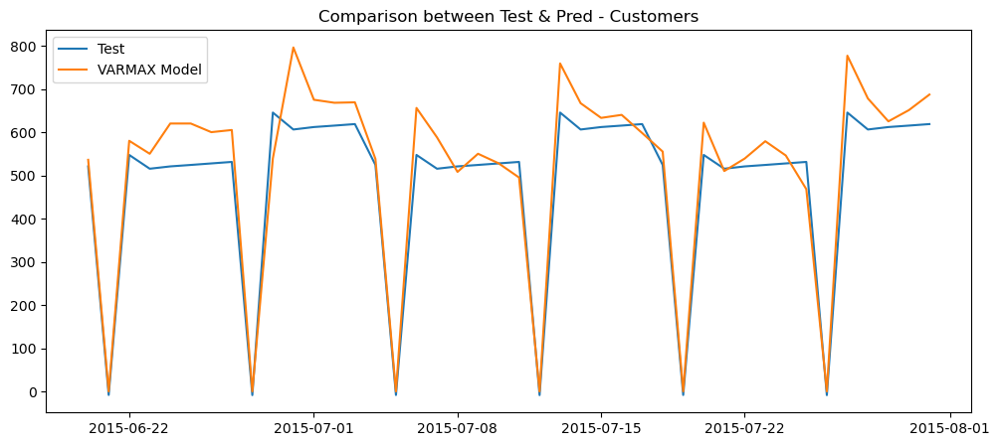

In [357]:
print_graph(output['Customers(Pred)'],output['Customers(Act)'],'Test','VARMAX Model','Comparison between Test & Pred - Customers')

### Store 13

In [691]:
store1 = merged_df[merged_df['Store']==13]
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
12,13,5,2015-07-31,8821,568,1,1,0,0,d,a,310.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"
1127,13,4,2015-07-30,7648,474,1,1,0,0,d,a,310.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"
2242,13,3,2015-07-29,6648,406,1,1,0,0,d,a,310.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"
3357,13,2,2015-07-28,6819,446,1,1,0,0,d,a,310.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"
4472,13,1,2015-07-27,7926,527,1,1,0,0,d,a,310.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"


In [692]:
store1['Date'] = pd.to_datetime(store1['Date'], format='%Y-%m-%d')
store1.index = store1.Date

In [693]:
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
Date,,,,,,,,,,,,,,,,,,
2015-07-31,13,5,2015-07-31,8821,568,1,1,0,0,d,a,310.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"
2015-07-30,13,4,2015-07-30,7648,474,1,1,0,0,d,a,310.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"
2015-07-29,13,3,2015-07-29,6648,406,1,1,0,0,d,a,310.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"
2015-07-28,13,2,2015-07-28,6819,446,1,1,0,0,d,a,310.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"
2015-07-27,13,1,2015-07-27,7926,527,1,1,0,0,d,a,310.0,NaN,NaN,1,45.0,2009.0,"Feb,May,Aug,Nov"


In [694]:
(store1.Date.max() - store1.Date.min())
store1.shape

(758, 18)

In [695]:
#There are no missing days, checking for missing data
store1.isnull().sum()

Store                          0
DayOfWeek                      0
Date                           0
Sales                          0
Customers                      0
Open                           0
Promo                          0
StateHoliday                   0
SchoolHoliday                  0
StoreType                      0
Assortment                     0
CompetitionDistance            0
CompetitionOpenSinceMonth    758
CompetitionOpenSinceYear     758
Promo2                         0
Promo2SinceWeek                0
Promo2SinceYear                0
PromoInterval                  0
dtype: int64

In [696]:
#As Promo 2 is 0 for Store 1, that means a second promo never existed for this Store, hence removing columns related to Promo2
store1 = store1.drop(['Promo2','Promo2SinceWeek','Promo2SinceYear','PromoInterval'], axis=1)
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
Date,,,,,,,,,,,,,,
2015-07-31,13,5,2015-07-31,8821,568,1,1,0,0,d,a,310.0,NaN,NaN
2015-07-30,13,4,2015-07-30,7648,474,1,1,0,0,d,a,310.0,NaN,NaN
2015-07-29,13,3,2015-07-29,6648,406,1,1,0,0,d,a,310.0,NaN,NaN
2015-07-28,13,2,2015-07-28,6819,446,1,1,0,0,d,a,310.0,NaN,NaN
2015-07-27,13,1,2015-07-27,7926,527,1,1,0,0,d,a,310.0,NaN,NaN


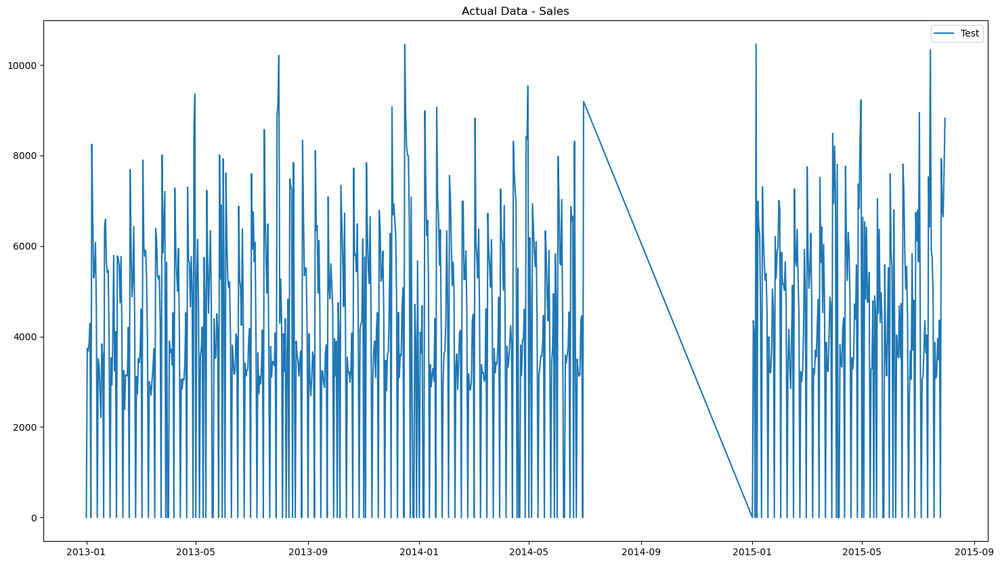

In [697]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store1['Sales'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

#### Data is missing for few dates, hence marking it as 0

In [698]:
new_date_range = pd.date_range(start="2014-07-01", end="2014-12-31", freq="D")
abc = store1.reindex(new_date_range, fill_value=0)

In [699]:
abc.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
count,184.0,184.0,184.0,184.0,184.0,184.0,184.0,184.0,184.0,184.0
mean,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [700]:
store2 = pd.concat([store1, abc])
store2.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
2015-07-31,13,5,2015-07-31 00:00:00,8821,568,1,1,0,0,d,a,310.0,NaN,NaN
2015-07-30,13,4,2015-07-30 00:00:00,7648,474,1,1,0,0,d,a,310.0,NaN,NaN
2015-07-29,13,3,2015-07-29 00:00:00,6648,406,1,1,0,0,d,a,310.0,NaN,NaN
2015-07-28,13,2,2015-07-28 00:00:00,6819,446,1,1,0,0,d,a,310.0,NaN,NaN
2015-07-27,13,1,2015-07-27 00:00:00,7926,527,1,1,0,0,d,a,310.0,NaN,NaN


In [702]:
store2 = store2.sort_index(ascending = True)

In [703]:
store1 = store2

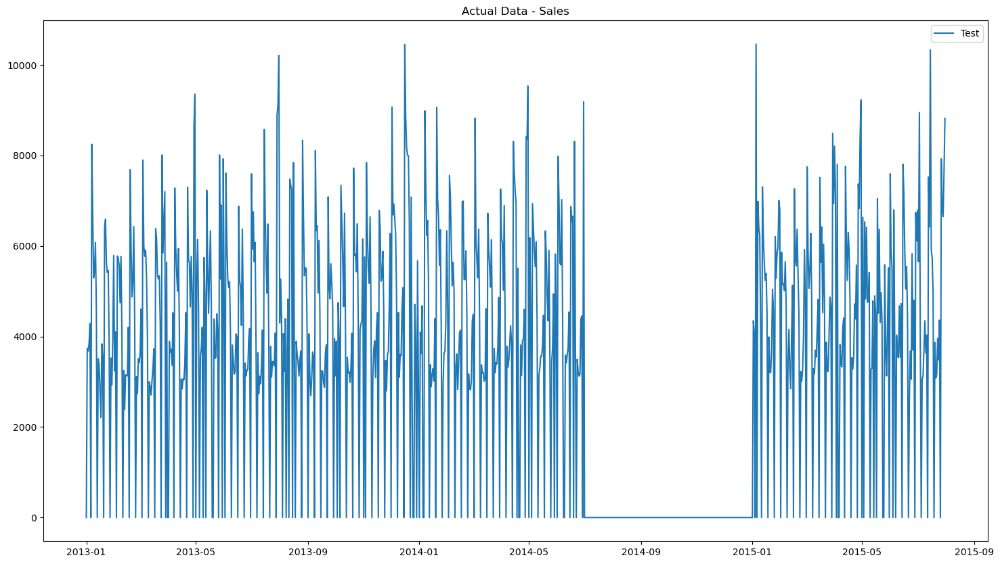

In [704]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store1['Sales'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

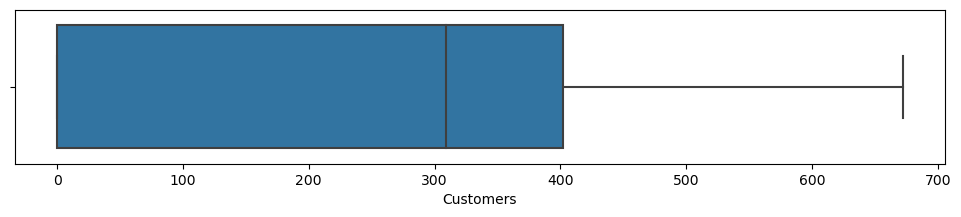

In [705]:
#Outlier Detection
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=store1['Customers'],whis=1.5)

##### Left hand side outliers are zero, we would want the model to capture 0s as the data is 0 here because the store was not open, this is something that the model needs to learn in order to forecast, we need to treat outliers on the right hand side which are skewed

In [706]:
store1.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
count,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,184.0,184.0
mean,10.460722,3.219745,3319.084926,252.377919,0.659236,0.303609,0.131635,249.447983,0.0,0.0
std,5.156638,2.394537,2724.758588,195.130484,0.474218,0.460060,0.338273,122.965971,0.0,0.0
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0
25%,13.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,310.000000,0.0,0.0
50%,13.000000,3.000000,3650.500000,309.000000,1.000000,0.000000,0.000000,310.000000,0.0,0.0
75%,13.000000,5.000000,5427.250000,401.750000,1.000000,1.000000,0.000000,310.000000,0.0,0.0
max,13.000000,7.000000,10460.000000,672.000000,1.000000,1.000000,1.000000,310.000000,0.0,0.0


In [707]:
#Replacing the outliers with median values for the Sales & Customer variables, as we can see there are a handful of outliers in the above box plot
ul_sales  = np.mean(store1.Sales) + np.std(store1.Sales) * 1.5
med_sales = np.median(store1.Sales)
ul_cust = np.mean(store1.Customers) + np.std(store1.Customers) * 1.5
med_cust = np.median(store1.Customers)

In [708]:
store1['sales2'] = np.where(store1['Sales']>ul_sales,med_sales,store1['Sales'])
store1['cust2'] = np.where(store1['Customers']>ul_cust,med_cust,store1['Customers'])

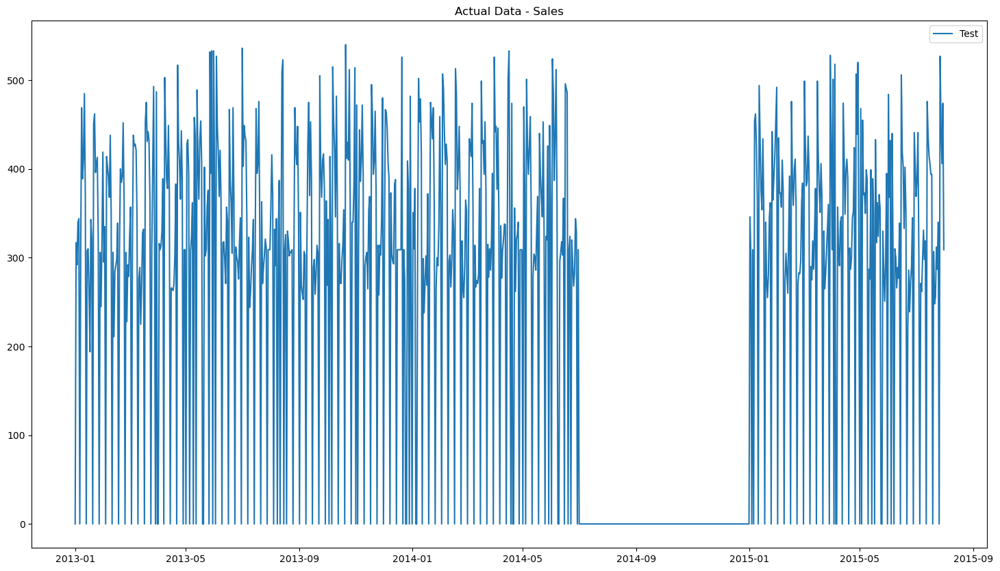

In [709]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store1['cust2'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

In [710]:
store1['SH'] = np.where(store1['StateHoliday']==0, 0, 1)

In [711]:
stationary_check(store1['sales2'])

ADF Statistic: -1.940362
p-value: 0.313318
Critical Values:
1% -3.437485646962348
5% -2.8646901138095378
10% -2.568447319459459


In [712]:
stationary_check(store1['cust2'])

ADF Statistic: -1.840193
p-value: 0.360697
Critical Values:
1% -3.437485646962348
5% -2.8646901138095378
10% -2.568447319459459


The p-value is very less than the significance level of 0.05 and hence we can reject the null hypothesis and consider that the series is stationary.

In [713]:
store1 = store1.sort_index(ascending = True)

## Split into Train & Test
test_size = 42

df_train = store1[:-test_size]
df_test = store1[-test_size:]

In [714]:
store1['SH'] = np.where(store1['StateHoliday']==0, 0, 1)

In [715]:
#Performing Scaling for the Sales & Customer Variables, Fit & Transform will be applied on the train data, and only trasnform will be applied on the Test Data
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [716]:
df_train[['sales3','cust3']] = scaler.fit_transform(df_train[['sales2','cust2']])

df_train.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,sales2,cust2,SH,sales3,cust3
2013-01-01,13,2,2013-01-01 00:00:00,0,0,0,0,a,1,d,a,310.0,NaN,NaN,0.0,0.0,1,0.000000,0.000000
2013-01-02,13,3,2013-01-02 00:00:00,3737,317,1,0,0,1,d,a,310.0,NaN,NaN,3737.0,317.0,1,0.507124,0.587037
2013-01-03,13,4,2013-01-03 00:00:00,3674,292,1,0,0,1,d,a,310.0,NaN,NaN,3674.0,292.0,1,0.498575,0.540741
2013-01-04,13,5,2013-01-04 00:00:00,3848,340,1,0,0,1,d,a,310.0,NaN,NaN,3848.0,340.0,1,0.522188,0.629630
2013-01-05,13,6,2013-01-05 00:00:00,4285,344,1,0,0,0,d,a,310.0,NaN,NaN,4285.0,344.0,1,0.581490,0.637037


In [717]:
df_test[['sales3','cust3']] = scaler.transform(df_test[['sales2','cust2']])

df_test.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,sales2,cust2,SH,sales3,cust3
2015-06-20,13,6,2015-06-20 00:00:00,4391,350,1,0,0,0,d,a,310.0,NaN,NaN,4391.0,350.0,1,0.595875,0.648148
2015-06-21,13,7,2015-06-21 00:00:00,0,0,0,0,0,0,d,a,310.0,NaN,NaN,0.0,0.0,1,0.000000,0.000000
2015-06-22,13,1,2015-06-22 00:00:00,2603,220,1,0,0,0,d,a,310.0,NaN,NaN,2603.0,220.0,1,0.353237,0.407407
2015-06-23,13,2,2015-06-23 00:00:00,3681,286,1,0,0,0,d,a,310.0,NaN,NaN,3681.0,286.0,1,0.499525,0.529630
2015-06-24,13,3,2015-06-24 00:00:00,3056,239,1,0,0,0,d,a,310.0,NaN,NaN,3056.0,239.0,1,0.414710,0.442593


In [718]:
exog = df_train[['Promo','Open','DayOfWeek']]
df_train['sales3'] = df_train['sales3'].astype('float64')
df_train['cust3'] = df_train['cust3'].astype('float64')
mod1 = sm.tsa.VARMAX(df_train[['sales3', 'cust3']], order=(1,0), trend='n', exog=exog)
res1 = mod1.fit(maxiter=1000, disp=False)
print(res1.summary())
#Note the AIC value - lower AIC => better model

                            Statespace Model Results                           
Dep. Variable:     ['sales3', 'cust3']   No. Observations:                  900
Model:                         VARX(1)   Log Likelihood                1994.469
Date:                 Wed, 22 Mar 2023   AIC                          -3962.937
Time:                         22:10:26   BIC                          -3900.506
Sample:                     01-01-2013   HQIC                         -3939.088
                          - 06-19-2015                                         
Covariance Type:                   opg                                         
Ljung-Box (L1) (Q):             4.91, 7.11   Jarque-Bera (JB):      116.03, 8482.98
Prob(Q):                        0.03, 0.01   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.67, 0.97   Skew:                       0.17, 1.89
Prob(H) (two-sided):            0.00, 0.78   Kurtosis:                  4.73, 17.56
                        

In [719]:
start_index = df_test.index.min()
end_index = df_test.index.max()
predictions = mod1.fit().predict(start=start_index, end=end_index, exog=df_test[['Promo','Open','DayOfWeek']])

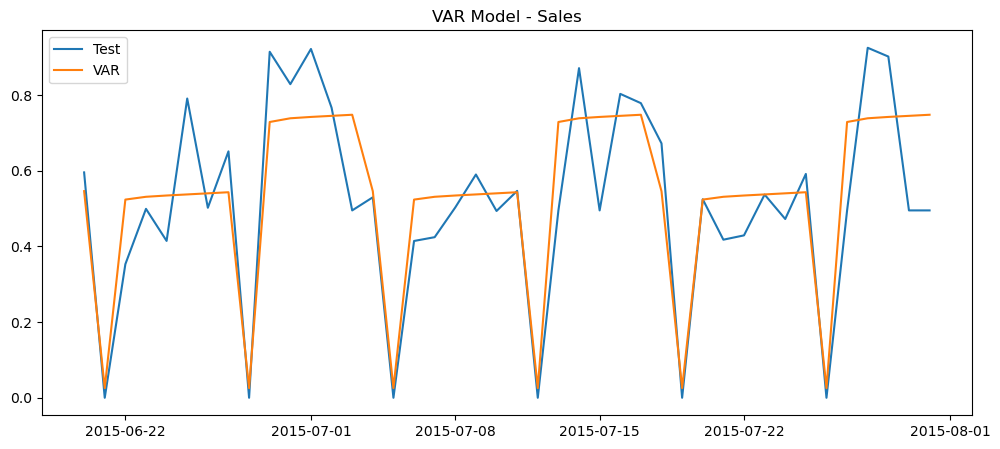

In [720]:
print_graph(df_test['sales3'], predictions['sales3'], 'Test', 'VAR', 'VAR Model - Sales')

In [721]:
output = pd.DataFrame({"Sales(Pred)":predictions['sales3'], "Customers(Pred)":predictions['cust3'],"Sales(Act)":df_test['sales3'], "Customers(Act)":df_test['cust3']})
output.head(10)

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,0.546355,0.612185,0.595875,0.648148
2015-06-21,0.025647,0.028388,0.000000,0.000000
2015-06-22,0.524003,0.615387,0.353237,0.407407
2015-06-23,0.531397,0.578774,0.499525,0.529630
2015-06-24,0.534779,0.592671,0.414710,0.442593
2015-06-25,0.537649,0.602813,0.791152,0.507407
2015-06-26,0.540542,0.613240,0.502375,0.535185
2015-06-27,0.543433,0.623646,0.651513,0.638889
2015-06-28,0.025493,0.027551,0.000000,0.000000
2015-06-29,0.729158,0.789521,0.914778,0.816667


In [722]:
col = ['Sales(Pred)','Customers(Pred)']
output[col] = scaler.inverse_transform(output[col])
output.head()

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,4026.090345,330.579660,0.595875,0.648148
2015-06-21,188.992772,15.329254,0.000000,0.000000
2015-06-22,3861.374891,332.308888,0.353237,0.407407
2015-06-23,3915.867984,312.537821,0.499525,0.529630
2015-06-24,3940.785957,320.042349,0.414710,0.442593


In [723]:
col = ['Sales(Act)','Customers(Act)']
output[col] = scaler.inverse_transform(output[col])
output.head()

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,4026.090345,330.579660,4391.0,350.0
2015-06-21,188.992772,15.329254,0.0,0.0
2015-06-22,3861.374891,332.308888,2603.0,220.0
2015-06-23,3915.867984,312.537821,3681.0,286.0
2015-06-24,3940.785957,320.042349,3056.0,239.0


In [724]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(output['Sales(Pred)'], output['Sales(Act)'])).round(2)
#print('Income: RMSE:',  rmse)

In [725]:
model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VAR'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(output['Customers(Pred)'], output['Customers(Act)'])).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VAR'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

model_comparison.reset_index(drop=True, inplace=True)
model_comparison

,Model,Variable,RMSE
0,VAR,Sales,966.93
1,VAR,Customers,45.21


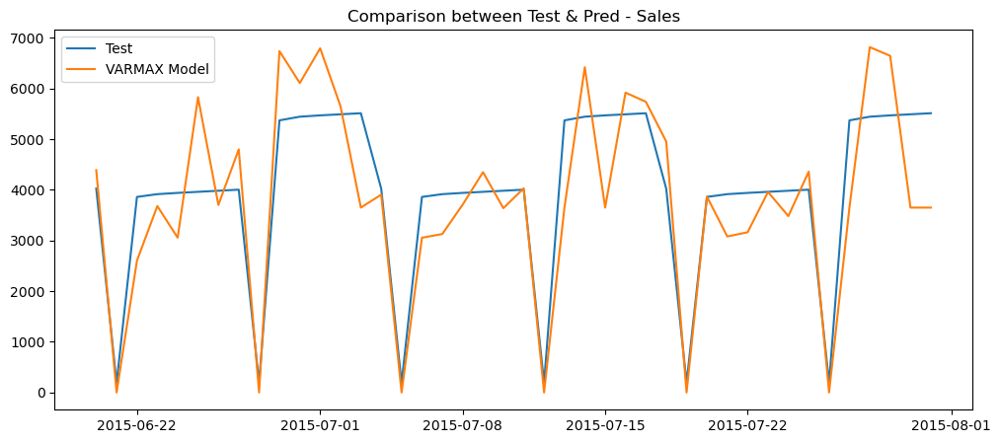

In [726]:
print_graph(output['Sales(Pred)'],output['Sales(Act)'],'Test','VARMAX Model','Comparison between Test & Pred - Sales')

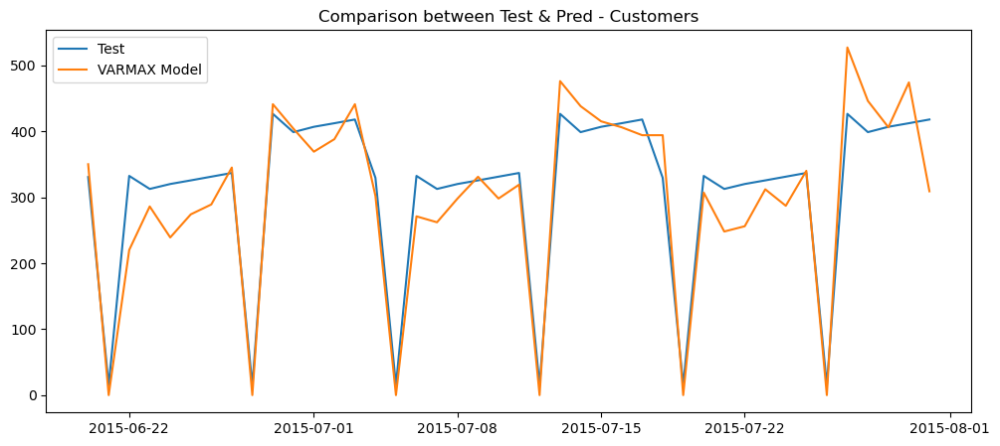

In [727]:
print_graph(output['Customers(Pred)'],output['Customers(Act)'],'Test','VARMAX Model','Comparison between Test & Pred - Customers')

### Store 25

In [424]:
store1 = merged_df[merged_df['Store']==25]
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
24,25,5,2015-07-31,14180,1586,1,1,0,1,c,a,430.0,4.0,2003.0,0,NaN,NaN,NaN
1139,25,4,2015-07-30,11272,1422,1,1,0,1,c,a,430.0,4.0,2003.0,0,NaN,NaN,NaN
2254,25,3,2015-07-29,10527,1254,1,1,0,1,c,a,430.0,4.0,2003.0,0,NaN,NaN,NaN
3369,25,2,2015-07-28,10865,1363,1,1,0,1,c,a,430.0,4.0,2003.0,0,NaN,NaN,NaN
4484,25,1,2015-07-27,11806,1536,1,1,0,1,c,a,430.0,4.0,2003.0,0,NaN,NaN,NaN


In [425]:
store1['Date'] = pd.to_datetime(store1['Date'], format='%Y-%m-%d')
store1.index = store1.Date

In [426]:
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
Date,,,,,,,,,,,,,,,,,,
2015-07-31,25,5,2015-07-31,14180,1586,1,1,0,1,c,a,430.0,4.0,2003.0,0,NaN,NaN,NaN
2015-07-30,25,4,2015-07-30,11272,1422,1,1,0,1,c,a,430.0,4.0,2003.0,0,NaN,NaN,NaN
2015-07-29,25,3,2015-07-29,10527,1254,1,1,0,1,c,a,430.0,4.0,2003.0,0,NaN,NaN,NaN
2015-07-28,25,2,2015-07-28,10865,1363,1,1,0,1,c,a,430.0,4.0,2003.0,0,NaN,NaN,NaN
2015-07-27,25,1,2015-07-27,11806,1536,1,1,0,1,c,a,430.0,4.0,2003.0,0,NaN,NaN,NaN


In [427]:
(store1.Date.max() - store1.Date.min())
store1.shape

(942, 18)

In [428]:
#There are no missing days, checking for missing data
store1.isnull().sum()

Store                          0
DayOfWeek                      0
Date                           0
Sales                          0
Customers                      0
Open                           0
Promo                          0
StateHoliday                   0
SchoolHoliday                  0
StoreType                      0
Assortment                     0
CompetitionDistance            0
CompetitionOpenSinceMonth      0
CompetitionOpenSinceYear       0
Promo2                         0
Promo2SinceWeek              942
Promo2SinceYear              942
PromoInterval                942
dtype: int64

In [429]:
#As Promo 2 is 0 for Store 1, that means a second promo never existed for this Store, hence removing columns related to Promo2
store1 = store1.drop(['Promo2','Promo2SinceWeek','Promo2SinceYear','PromoInterval'], axis=1)
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
Date,,,,,,,,,,,,,,
2015-07-31,25,5,2015-07-31,14180,1586,1,1,0,1,c,a,430.0,4.0,2003.0
2015-07-30,25,4,2015-07-30,11272,1422,1,1,0,1,c,a,430.0,4.0,2003.0
2015-07-29,25,3,2015-07-29,10527,1254,1,1,0,1,c,a,430.0,4.0,2003.0
2015-07-28,25,2,2015-07-28,10865,1363,1,1,0,1,c,a,430.0,4.0,2003.0
2015-07-27,25,1,2015-07-27,11806,1536,1,1,0,1,c,a,430.0,4.0,2003.0


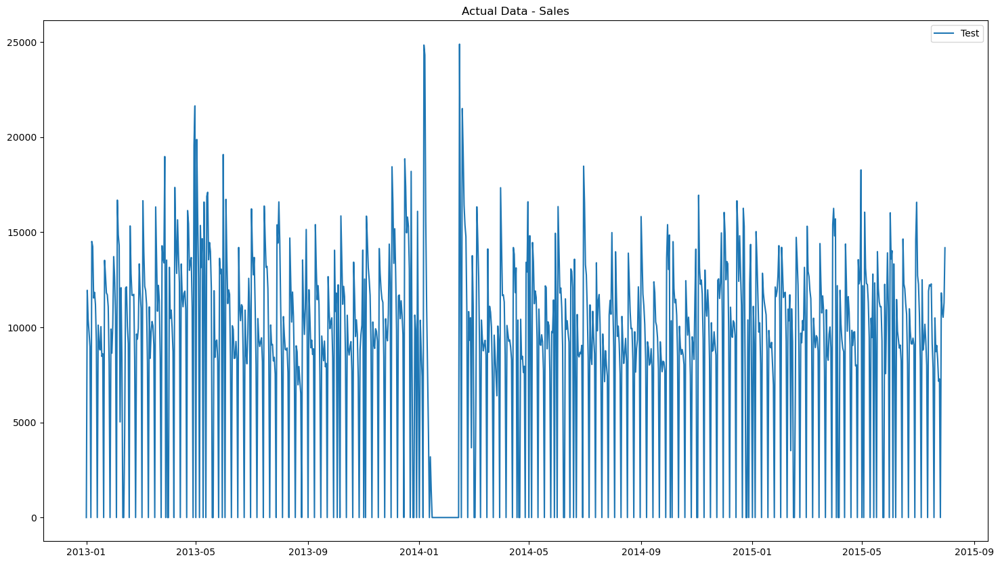

In [430]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store1['Sales'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

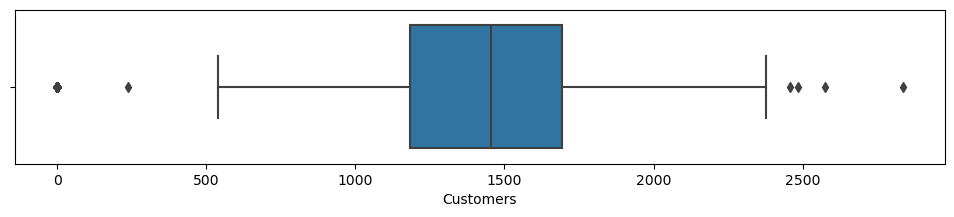

In [431]:
#Outlier Detection
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=store1['Customers'],whis=1.5)

##### Left hand side outliers are zero, we would want the model to capture 0s as the data is 0 here because the store was not open, this is something that the model needs to learn in order to forecast, we need to treat outliers on the right hand side which are skewed

In [432]:
store1.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
count,942.0,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.0,942.0,942.0
mean,25.0,3.997877,8892.311040,1250.288747,0.798301,0.382166,0.180467,430.0,4.0,2003.0
std,0.0,1.998404,5151.671996,686.376385,0.401481,0.486175,0.384780,0.0,0.0,0.0
min,25.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,430.0,4.0,2003.0
25%,25.0,2.000000,7858.750000,1182.000000,1.000000,0.000000,0.000000,430.0,4.0,2003.0
50%,25.0,4.000000,9806.000000,1456.500000,1.000000,0.000000,0.000000,430.0,4.0,2003.0
75%,25.0,6.000000,12125.250000,1692.000000,1.000000,1.000000,0.000000,430.0,4.0,2003.0
max,25.0,7.000000,24882.000000,2835.000000,1.000000,1.000000,1.000000,430.0,4.0,2003.0


In [433]:
#Replacing the outliers with median values for the Sales & Customer variables, as we can see there are a handful of outliers in the above box plot
ul_sales  = np.mean(store1.Sales) + np.std(store1.Sales) * 1.5
med_sales = np.median(store1.Sales)
ul_cust = np.mean(store1.Customers) + np.std(store1.Customers) * 1.5
med_cust = np.median(store1.Customers)

In [434]:
store1['sales2'] = np.where(store1['Sales']>ul_sales,med_sales,store1['Sales'])
store1['cust2'] = np.where(store1['Customers']>ul_cust,med_cust,store1['Customers'])

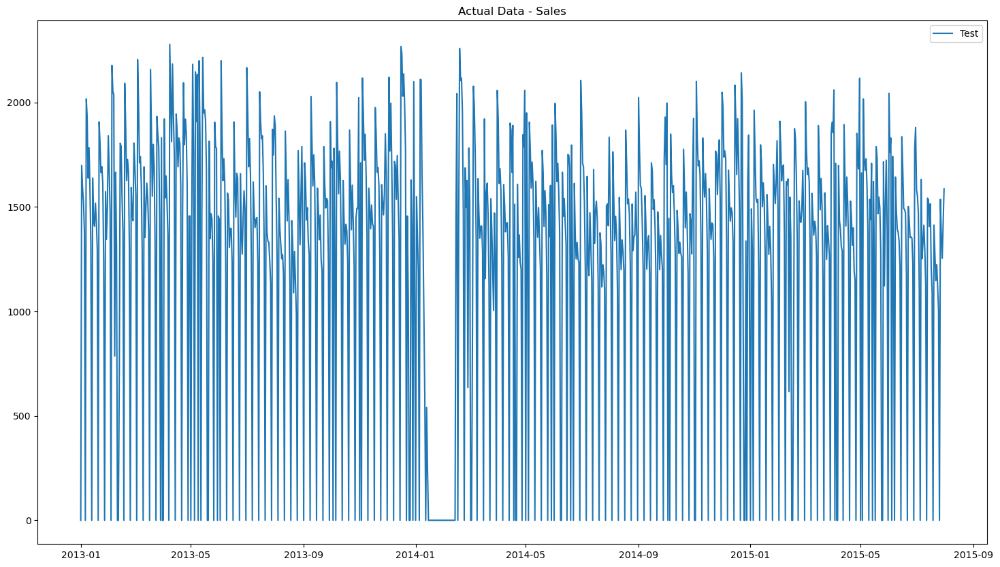

In [435]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store1['cust2'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

In [436]:
store1['SH'] = np.where(store1['StateHoliday']==0, 0, 1)

In [437]:
stationary_check(store1['sales2'])

ADF Statistic: -4.108675
p-value: 0.000937
Critical Values:
1% -3.4374778690219956
5% -2.864686684217556
10% -2.5684454926748583


In [438]:
stationary_check(store1['cust2'])

ADF Statistic: -3.965726
p-value: 0.001601
Critical Values:
1% -3.4374778690219956
5% -2.864686684217556
10% -2.5684454926748583


The p-value is very less than the significance level of 0.05 and hence we can reject the null hypothesis and consider that the series is stationary.

In [439]:
store1 = store1.sort_index(ascending = True)

## Split into Train & Test
test_size = 42

df_train = store1[:-test_size]
df_test = store1[-test_size:]

In [440]:
store1['SH'] = np.where(store1['StateHoliday']==0, 0, 1)

In [441]:
#Performing Scaling for the Sales & Customer Variables, Fit & Transform will be applied on the train data, and only trasnform will be applied on the Test Data
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [442]:
df_train[['sales3','cust3']] = scaler.fit_transform(df_train[['sales2','cust2']])

df_train.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,sales2,cust2,SH,sales3,cust3
Date,,,,,,,,,,,,,,,,,,,
2013-01-01,25,2,2013-01-01,0,0,0,0,a,1,c,a,430.0,4.0,2003.0,0.0,0.0,1,0.000000,0.000000
2013-01-02,25,3,2013-01-02,11944,1698,1,0,0,1,c,a,430.0,4.0,2003.0,11944.0,1698.0,1,0.719691,0.745391
2013-01-03,25,4,2013-01-03,10409,1587,1,0,0,1,c,a,430.0,4.0,2003.0,10409.0,1587.0,1,0.627199,0.696664
2013-01-04,25,5,2013-01-04,9729,1520,1,0,0,1,c,a,430.0,4.0,2003.0,9729.0,1520.0,1,0.586226,0.667252
2013-01-05,25,6,2013-01-05,8987,1381,1,0,0,0,c,a,430.0,4.0,2003.0,8987.0,1381.0,1,0.541516,0.606234


In [443]:
df_test[['sales3','cust3']] = scaler.transform(df_test[['sales2','cust2']])

df_test.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,sales2,cust2,SH,sales3,cust3
Date,,,,,,,,,,,,,,,,,,,
2015-06-20,25,6,2015-06-20,8067,1168,1,0,0,0,c,a,430.0,4.0,2003.0,8067.0,1168.0,1,0.486081,0.512730
2015-06-21,25,7,2015-06-21,0,0,0,0,0,0,c,a,430.0,4.0,2003.0,0.0,0.0,1,0.000000,0.000000
2015-06-22,25,1,2015-06-22,10972,1502,1,0,0,0,c,a,430.0,4.0,2003.0,10972.0,1502.0,1,0.661123,0.659350
2015-06-23,25,2,2015-06-23,9788,1439,1,0,0,0,c,a,430.0,4.0,2003.0,9788.0,1439.0,1,0.589781,0.631694
2015-06-24,25,3,2015-06-24,9138,1353,1,0,0,0,c,a,430.0,4.0,2003.0,9138.0,1353.0,1,0.550615,0.593942


In [444]:
exog = df_train[['Promo','Open','DayOfWeek']]
df_train['sales3'] = df_train['sales3'].astype('float64')
df_train['cust3'] = df_train['cust3'].astype('float64')
mod1 = sm.tsa.VARMAX(df_train[['sales3', 'cust3']], order=(1,0), trend='n', exog=exog)
res1 = mod1.fit(maxiter=1000, disp=False)
print(res1.summary())
#Note the AIC value - lower AIC => better model

                            Statespace Model Results                           
Dep. Variable:     ['sales3', 'cust3']   No. Observations:                  900
Model:                         VARX(1)   Log Likelihood                2099.748
Date:                 Wed, 22 Mar 2023   AIC                          -4173.495
Time:                         20:37:02   BIC                          -4111.064
Sample:                     01-01-2013   HQIC                         -4149.646
                          - 06-19-2015                                         
Covariance Type:                   opg                                         
Ljung-Box (L1) (Q):            59.60, 1.74   Jarque-Bera (JB):     612.10, 14833.55
Prob(Q):                        0.00, 0.19   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.71, 0.55   Skew:                      -0.37, 2.49
Prob(H) (two-sided):            0.00, 0.00   Kurtosis:                  6.97, 22.26
                        

In [445]:
start_index = df_test.index.min()
end_index = df_test.index.max()
predictions = mod1.fit().predict(start=start_index, end=end_index, exog=df_test[['Promo','Open','DayOfWeek']])

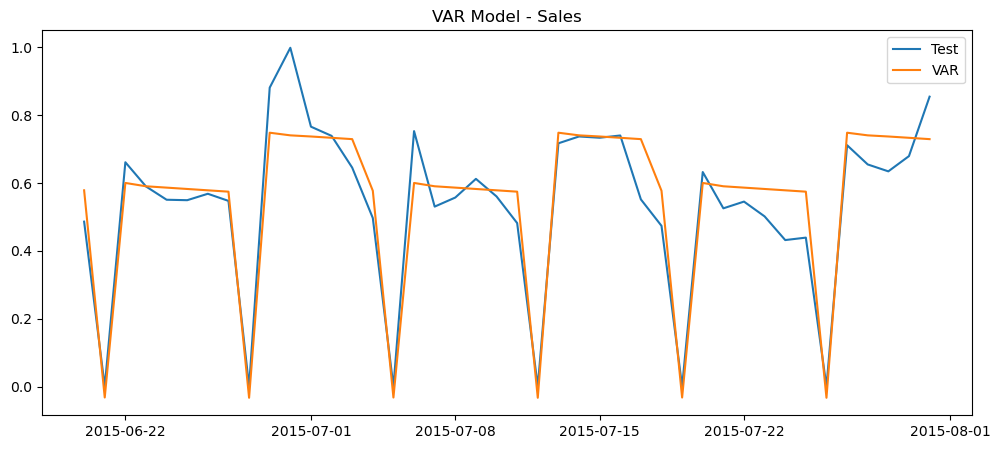

In [446]:
print_graph(df_test['sales3'], predictions['sales3'], 'Test', 'VAR', 'VAR Model - Sales')

In [447]:
output = pd.DataFrame({"Sales(Pred)":predictions['sales3'], "Customers(Pred)":predictions['cust3'],"Sales(Act)":df_test['sales3'], "Customers(Act)":df_test['cust3']})
output.head(10)

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,0.578408,0.612688,0.486081,0.512730
2015-06-21,-0.032299,-0.037486,0.000000,0.000000
2015-06-22,0.600130,0.645080,0.661123,0.659350
2015-06-23,0.590305,0.634913,0.589781,0.631694
2015-06-24,0.586334,0.630568,0.550615,0.593942
2015-06-25,0.582359,0.626129,0.549289,0.595698
2015-06-26,0.578392,0.621681,0.568209,0.592625
2015-06-27,0.574427,0.617232,0.547240,0.539069
2015-06-28,-0.033131,-0.036699,0.000000,0.000000
2015-06-29,0.748184,0.771727,0.880995,0.781826


In [448]:
col = ['Sales(Pred)','Customers(Pred)']
output[col] = scaler.inverse_transform(output[col])
output.head()

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,9599.267238,1395.702173,0.486081,0.512730
2015-06-21,-536.040763,-85.393183,0.000000,0.000000
2015-06-22,9959.759316,1469.492322,0.661123,0.659350
2015-06-23,9796.700726,1446.331955,0.589781,0.631694
2015-06-24,9730.804394,1436.434463,0.550615,0.593942


In [449]:
col = ['Sales(Act)','Customers(Act)']
output[col] = scaler.inverse_transform(output[col])
output.head()

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,9599.267238,1395.702173,8067.0,1168.0
2015-06-21,-536.040763,-85.393183,0.0,0.0
2015-06-22,9959.759316,1469.492322,10972.0,1502.0
2015-06-23,9796.700726,1446.331955,9788.0,1439.0
2015-06-24,9730.804394,1436.434463,9138.0,1353.0


In [450]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(output['Sales(Pred)'], output['Sales(Act)'])).round(2)
#print('Income: RMSE:',  rmse)

In [451]:
model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VAR'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(output['Customers(Pred)'], output['Customers(Act)'])).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VAR'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

model_comparison.reset_index(drop=True, inplace=True)
model_comparison

,Model,Variable,RMSE
0,VAR,Sales,1385.30
1,VAR,Customers,214.91


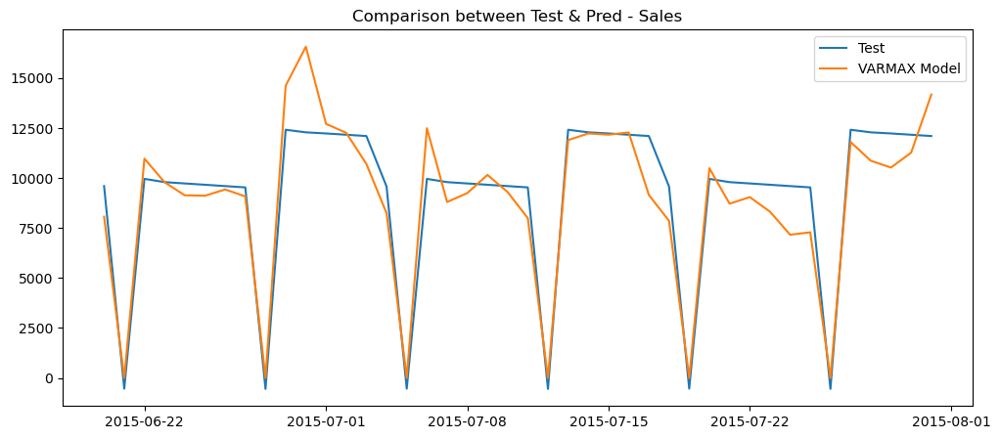

In [452]:
print_graph(output['Sales(Pred)'],output['Sales(Act)'],'Test','VARMAX Model','Comparison between Test & Pred - Sales')

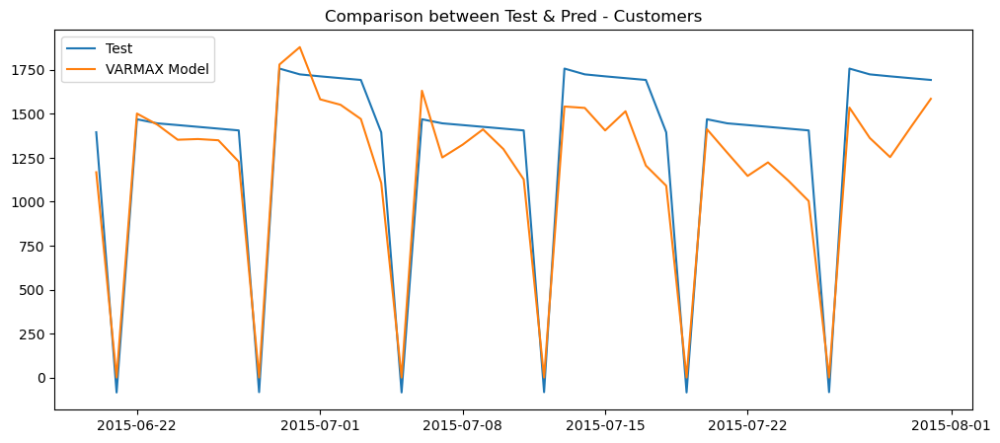

In [453]:
print_graph(output['Customers(Pred)'],output['Customers(Act)'],'Test','VARMAX Model','Comparison between Test & Pred - Customers')

### Store 29

In [529]:
store1 = merged_df[merged_df['Store']==29]
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
28,29,5,2015-07-31,9411,737,1,1,0,1,d,c,2170.0,NaN,NaN,0,NaN,NaN,NaN
1143,29,4,2015-07-30,8039,661,1,1,0,1,d,c,2170.0,NaN,NaN,0,NaN,NaN,NaN
2258,29,3,2015-07-29,7564,614,1,1,0,1,d,c,2170.0,NaN,NaN,0,NaN,NaN,NaN
3373,29,2,2015-07-28,8450,697,1,1,0,1,d,c,2170.0,NaN,NaN,0,NaN,NaN,NaN
4488,29,1,2015-07-27,11659,889,1,1,0,1,d,c,2170.0,NaN,NaN,0,NaN,NaN,NaN


In [530]:
store1['Date'] = pd.to_datetime(store1['Date'], format='%Y-%m-%d')
store1.index = store1.Date

In [531]:
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
Date,,,,,,,,,,,,,,,,,,
2015-07-31,29,5,2015-07-31,9411,737,1,1,0,1,d,c,2170.0,NaN,NaN,0,NaN,NaN,NaN
2015-07-30,29,4,2015-07-30,8039,661,1,1,0,1,d,c,2170.0,NaN,NaN,0,NaN,NaN,NaN
2015-07-29,29,3,2015-07-29,7564,614,1,1,0,1,d,c,2170.0,NaN,NaN,0,NaN,NaN,NaN
2015-07-28,29,2,2015-07-28,8450,697,1,1,0,1,d,c,2170.0,NaN,NaN,0,NaN,NaN,NaN
2015-07-27,29,1,2015-07-27,11659,889,1,1,0,1,d,c,2170.0,NaN,NaN,0,NaN,NaN,NaN


In [532]:
(store1.Date.max() - store1.Date.min())
store1.shape

(942, 18)

In [533]:
#There are no missing days, checking for missing data
store1.isnull().sum()

Store                          0
DayOfWeek                      0
Date                           0
Sales                          0
Customers                      0
Open                           0
Promo                          0
StateHoliday                   0
SchoolHoliday                  0
StoreType                      0
Assortment                     0
CompetitionDistance            0
CompetitionOpenSinceMonth    942
CompetitionOpenSinceYear     942
Promo2                         0
Promo2SinceWeek              942
Promo2SinceYear              942
PromoInterval                942
dtype: int64

In [534]:
#As Promo 2 is 0 for Store 1, that means a second promo never existed for this Store, hence removing columns related to Promo2
store1 = store1.drop(['Promo2','Promo2SinceWeek','Promo2SinceYear','PromoInterval'], axis=1)
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
Date,,,,,,,,,,,,,,
2015-07-31,29,5,2015-07-31,9411,737,1,1,0,1,d,c,2170.0,NaN,NaN
2015-07-30,29,4,2015-07-30,8039,661,1,1,0,1,d,c,2170.0,NaN,NaN
2015-07-29,29,3,2015-07-29,7564,614,1,1,0,1,d,c,2170.0,NaN,NaN
2015-07-28,29,2,2015-07-28,8450,697,1,1,0,1,d,c,2170.0,NaN,NaN
2015-07-27,29,1,2015-07-27,11659,889,1,1,0,1,d,c,2170.0,NaN,NaN


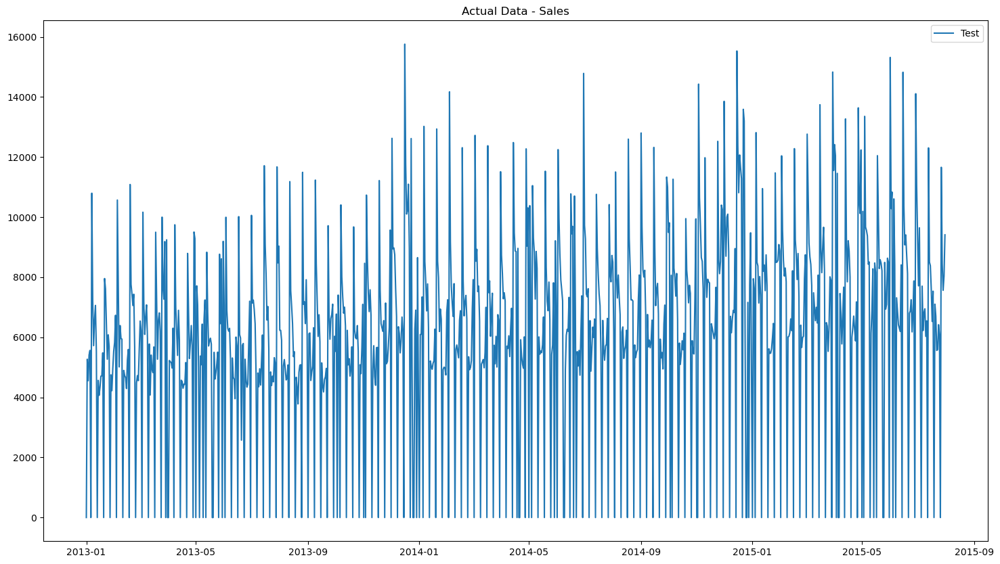

In [535]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store1['Sales'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

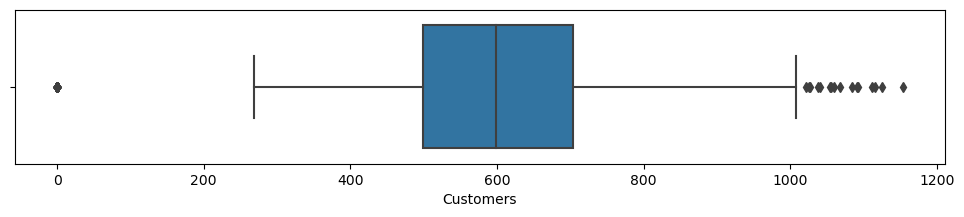

In [536]:
#Outlier Detection
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=store1['Customers'],whis=1.5)

##### Left hand side outliers are zero, we would want the model to capture 0s as the data is 0 here because the store was not open, this is something that the model needs to learn in order to forecast, we need to treat outliers on the right hand side which are skewed

In [537]:
store1.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
count,942.0,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.0,0.0,0.0
mean,29.0,3.997877,6090.403397,540.587049,0.826964,0.382166,0.180467,2170.0,NaN,NaN
std,0.0,1.998404,3433.366553,277.347395,0.378479,0.486175,0.384780,0.0,NaN,NaN
min,29.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,2170.0,NaN,NaN
25%,29.0,2.000000,4972.500000,498.500000,1.000000,0.000000,0.000000,2170.0,NaN,NaN
50%,29.0,4.000000,6361.500000,598.000000,1.000000,0.000000,0.000000,2170.0,NaN,NaN
75%,29.0,6.000000,8072.000000,703.000000,1.000000,1.000000,0.000000,2170.0,NaN,NaN
max,29.0,7.000000,15758.000000,1153.000000,1.000000,1.000000,1.000000,2170.0,NaN,NaN


In [538]:
#Replacing the outliers with median values for the Sales & Customer variables, as we can see there are a handful of outliers in the above box plot
ul_sales  = np.mean(store1.Sales) + np.std(store1.Sales) * 1.5
med_sales = np.median(store1.Sales)
ul_cust = np.mean(store1.Customers) + np.std(store1.Customers) * 1.5
med_cust = np.median(store1.Customers)

In [539]:
store1['sales2'] = np.where(store1['Sales']>ul_sales,med_sales,store1['Sales'])
store1['cust2'] = np.where(store1['Customers']>ul_cust,med_cust,store1['Customers'])

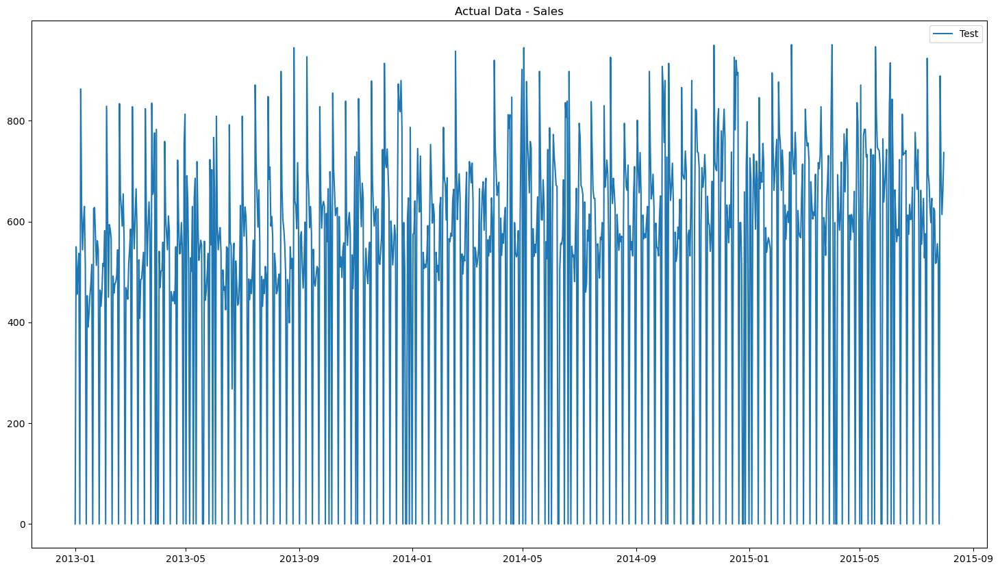

In [540]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store1['cust2'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

In [541]:
store1['SH'] = np.where(store1['StateHoliday']==0, 0, 1)

In [542]:
stationary_check(store1['sales2'])

ADF Statistic: -4.274859
p-value: 0.000491
Critical Values:
1% -3.4374778690219956
5% -2.864686684217556
10% -2.5684454926748583


In [543]:
stationary_check(store1['cust2'])

ADF Statistic: -3.578592
p-value: 0.006184
Critical Values:
1% -3.4374778690219956
5% -2.864686684217556
10% -2.5684454926748583


The p-value is very less than the significance level of 0.05 and hence we can reject the null hypothesis and consider that the series is stationary.

In [544]:
store1 = store1.sort_index(ascending = True)

## Split into Train & Test
test_size = 42

df_train = store1[:-test_size]
df_test = store1[-test_size:]

In [545]:
store1['SH'] = np.where(store1['StateHoliday']==0, 0, 1)

In [546]:
#Performing Scaling for the Sales & Customer Variables, Fit & Transform will be applied on the train data, and only trasnform will be applied on the Test Data
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [547]:
df_train[['sales3','cust3']] = scaler.fit_transform(df_train[['sales2','cust2']])

df_train.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,sales2,cust2,SH,sales3,cust3
Date,,,,,,,,,,,,,,,,,,,
2013-01-01,29,2,2013-01-01,0,0,0,0,a,1,d,c,2170.0,NaN,NaN,0.0,0.0,1,0.000000,0.000000
2013-01-02,29,3,2013-01-02,5269,550,1,0,0,1,d,c,2170.0,NaN,NaN,5269.0,550.0,1,0.469064,0.578339
2013-01-03,29,4,2013-01-03,4554,456,1,0,0,1,d,c,2170.0,NaN,NaN,4554.0,456.0,1,0.405413,0.479495
2013-01-04,29,5,2013-01-04,5411,505,1,0,0,1,d,c,2170.0,NaN,NaN,5411.0,505.0,1,0.481706,0.531020
2013-01-05,29,6,2013-01-05,5564,537,1,0,0,0,d,c,2170.0,NaN,NaN,5564.0,537.0,1,0.495326,0.564669


In [548]:
df_test[['sales3','cust3']] = scaler.transform(df_test[['sales2','cust2']])

df_test.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,sales2,cust2,SH,sales3,cust3
Date,,,,,,,,,,,,,,,,,,,
2015-06-20,29,6,2015-06-20,8117,741,1,0,0,0,d,c,2170.0,NaN,NaN,8117.0,741.0,1,0.722603,0.779180
2015-06-21,29,7,2015-06-21,0,0,0,0,0,0,d,c,2170.0,NaN,NaN,0.0,0.0,1,0.000000,0.000000
2015-06-22,29,1,2015-06-22,6798,613,1,0,0,0,d,c,2170.0,NaN,NaN,6798.0,613.0,1,0.605181,0.644585
2015-06-23,29,2,2015-06-23,6875,575,1,0,0,0,d,c,2170.0,NaN,NaN,6875.0,575.0,1,0.612036,0.604627
2015-06-24,29,3,2015-06-24,7251,634,1,0,0,0,d,c,2170.0,NaN,NaN,7251.0,634.0,1,0.645509,0.666667


In [549]:
exog = df_train[['Promo','Open','DayOfWeek']]
df_train['sales3'] = df_train['sales3'].astype('float64')
df_train['cust3'] = df_train['cust3'].astype('float64')
mod1 = sm.tsa.VARMAX(df_train[['sales3', 'cust3']], order=(1,0), trend='n', exog=exog)
res1 = mod1.fit(maxiter=1000, disp=False)
print(res1.summary())
#Note the AIC value - lower AIC => better model

                            Statespace Model Results                           
Dep. Variable:     ['sales3', 'cust3']   No. Observations:                  900
Model:                         VARX(1)   Log Likelihood                2025.052
Date:                 Wed, 22 Mar 2023   AIC                          -4024.104
Time:                         20:50:57   BIC                          -3961.673
Sample:                     01-01-2013   HQIC                         -4000.255
                          - 06-19-2015                                         
Covariance Type:                   opg                                         
Ljung-Box (L1) (Q):           40.19, 10.86   Jarque-Bera (JB):      82.99, 13587.16
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.93, 2.44   Skew:                       0.49, 3.52
Prob(H) (two-sided):            0.56, 0.00   Kurtosis:                  4.12, 20.69
                        

In [550]:
start_index = df_test.index.min()
end_index = df_test.index.max()
predictions = mod1.fit().predict(start=start_index, end=end_index, exog=df_test[['Promo','Open','DayOfWeek']])

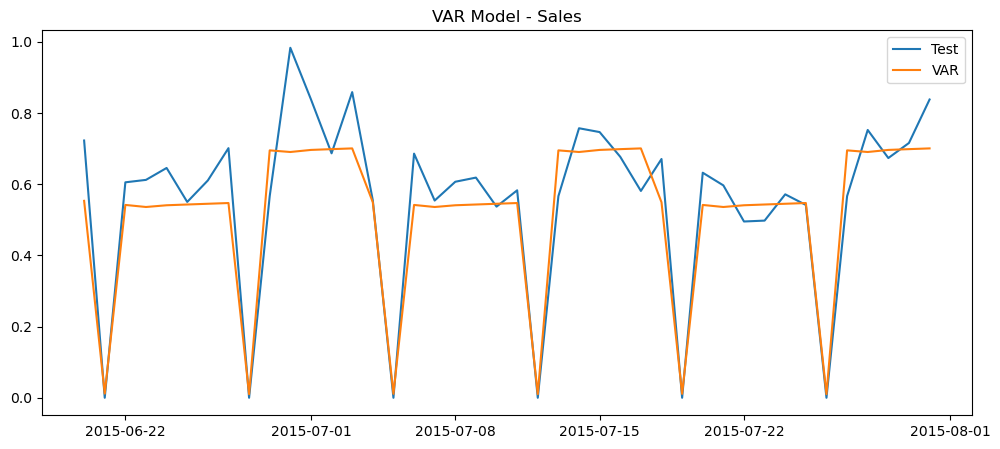

In [551]:
print_graph(df_test['sales3'], predictions['sales3'], 'Test', 'VAR', 'VAR Model - Sales')

In [552]:
output = pd.DataFrame({"Sales(Pred)":predictions['sales3'], "Customers(Pred)":predictions['cust3'],"Sales(Act)":df_test['sales3'], "Customers(Act)":df_test['cust3']})
output.head(10)

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,0.553144,0.605144,0.722603,0.779180
2015-06-21,0.011759,0.008968,0.000000,0.000000
2015-06-22,0.541681,0.622043,0.605181,0.644585
2015-06-23,0.535884,0.589836,0.612036,0.604627
2015-06-24,0.540734,0.598239,0.645509,0.666667
2015-06-25,0.542871,0.604668,0.550076,0.635121
2015-06-26,0.544946,0.611249,0.610434,0.636172
2015-06-27,0.547002,0.617825,0.701148,0.702419
2015-06-28,0.010073,0.008590,0.000000,0.000000
2015-06-29,0.694928,0.760556,0.566322,0.628812


In [553]:
col = ['Sales(Pred)','Customers(Pred)']
output[col] = scaler.inverse_transform(output[col])
output.head()

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,6213.466490,575.492057,0.722603,0.779180
2015-06-21,132.087453,8.528209,0.000000,0.000000
2015-06-22,6084.703270,591.562760,0.605181,0.644585
2015-06-23,6019.581166,560.933848,0.612036,0.604627
2015-06-24,6074.064202,568.925317,0.645509,0.666667


In [554]:
col = ['Sales(Act)','Customers(Act)']
output[col] = scaler.inverse_transform(output[col])
output.head()

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,6213.466490,575.492057,8117.0,741.0
2015-06-21,132.087453,8.528209,0.0,0.0
2015-06-22,6084.703270,591.562760,6798.0,613.0
2015-06-23,6019.581166,560.933848,6875.0,575.0
2015-06-24,6074.064202,568.925317,7251.0,634.0


In [555]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(output['Sales(Pred)'], output['Sales(Act)'])).round(2)
#print('Income: RMSE:',  rmse)

In [556]:
model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VAR'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(output['Customers(Pred)'], output['Customers(Act)'])).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VAR'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

model_comparison.reset_index(drop=True, inplace=True)
model_comparison

,Model,Variable,RMSE
0,VAR,Sales,1051.76
1,VAR,Customers,68.15


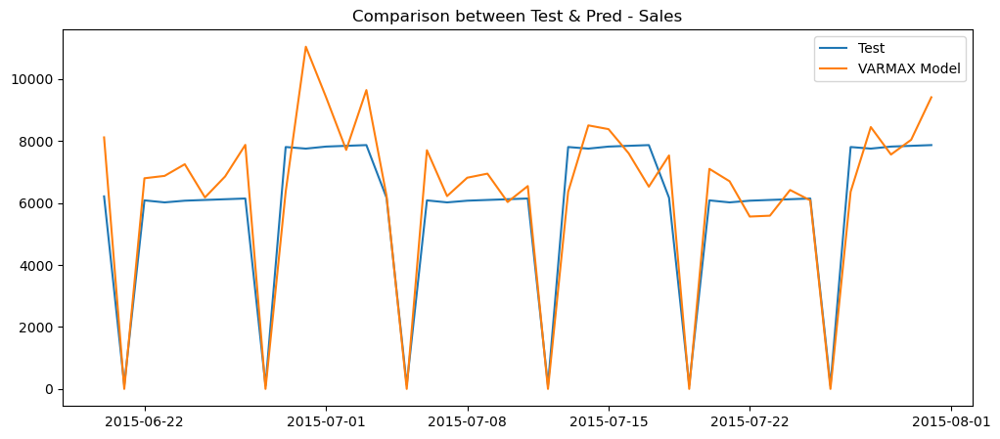

In [557]:
print_graph(output['Sales(Pred)'],output['Sales(Act)'],'Test','VARMAX Model','Comparison between Test & Pred - Sales')

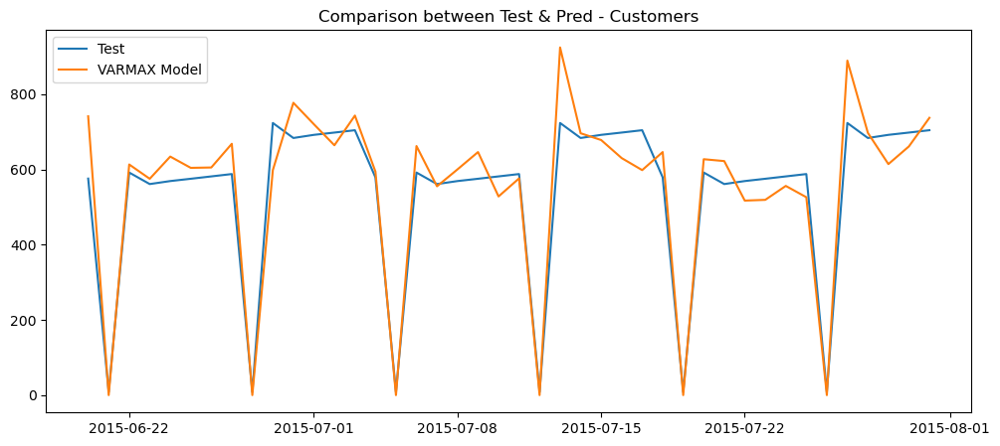

In [558]:
print_graph(output['Customers(Pred)'],output['Customers(Act)'],'Test','VARMAX Model','Comparison between Test & Pred - Customers')

### Store 31

In [484]:
store1 = merged_df[merged_df['Store']==31]
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
30,31,5,2015-07-31,7248,645,1,1,0,1,d,c,9800.0,7.0,2012.0,0,NaN,NaN,NaN
1145,31,4,2015-07-30,6712,582,1,1,0,1,d,c,9800.0,7.0,2012.0,0,NaN,NaN,NaN
2260,31,3,2015-07-29,5982,570,1,1,0,1,d,c,9800.0,7.0,2012.0,0,NaN,NaN,NaN
3375,31,2,2015-07-28,5736,492,1,1,0,1,d,c,9800.0,7.0,2012.0,0,NaN,NaN,NaN
4490,31,1,2015-07-27,8054,684,1,1,0,1,d,c,9800.0,7.0,2012.0,0,NaN,NaN,NaN


In [485]:
store1['Date'] = pd.to_datetime(store1['Date'], format='%Y-%m-%d')
store1.index = store1.Date

In [486]:
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
Date,,,,,,,,,,,,,,,,,,
2015-07-31,31,5,2015-07-31,7248,645,1,1,0,1,d,c,9800.0,7.0,2012.0,0,NaN,NaN,NaN
2015-07-30,31,4,2015-07-30,6712,582,1,1,0,1,d,c,9800.0,7.0,2012.0,0,NaN,NaN,NaN
2015-07-29,31,3,2015-07-29,5982,570,1,1,0,1,d,c,9800.0,7.0,2012.0,0,NaN,NaN,NaN
2015-07-28,31,2,2015-07-28,5736,492,1,1,0,1,d,c,9800.0,7.0,2012.0,0,NaN,NaN,NaN
2015-07-27,31,1,2015-07-27,8054,684,1,1,0,1,d,c,9800.0,7.0,2012.0,0,NaN,NaN,NaN


In [487]:
(store1.Date.max() - store1.Date.min())
store1.shape

(942, 18)

In [488]:
#There are no missing days, checking for missing data
store1.isnull().sum()

Store                          0
DayOfWeek                      0
Date                           0
Sales                          0
Customers                      0
Open                           0
Promo                          0
StateHoliday                   0
SchoolHoliday                  0
StoreType                      0
Assortment                     0
CompetitionDistance            0
CompetitionOpenSinceMonth      0
CompetitionOpenSinceYear       0
Promo2                         0
Promo2SinceWeek              942
Promo2SinceYear              942
PromoInterval                942
dtype: int64

In [489]:
#As Promo 2 is 0 for Store 1, that means a second promo never existed for this Store, hence removing columns related to Promo2
store1 = store1.drop(['Promo2','Promo2SinceWeek','Promo2SinceYear','PromoInterval'], axis=1)
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
Date,,,,,,,,,,,,,,
2015-07-31,31,5,2015-07-31,7248,645,1,1,0,1,d,c,9800.0,7.0,2012.0
2015-07-30,31,4,2015-07-30,6712,582,1,1,0,1,d,c,9800.0,7.0,2012.0
2015-07-29,31,3,2015-07-29,5982,570,1,1,0,1,d,c,9800.0,7.0,2012.0
2015-07-28,31,2,2015-07-28,5736,492,1,1,0,1,d,c,9800.0,7.0,2012.0
2015-07-27,31,1,2015-07-27,8054,684,1,1,0,1,d,c,9800.0,7.0,2012.0


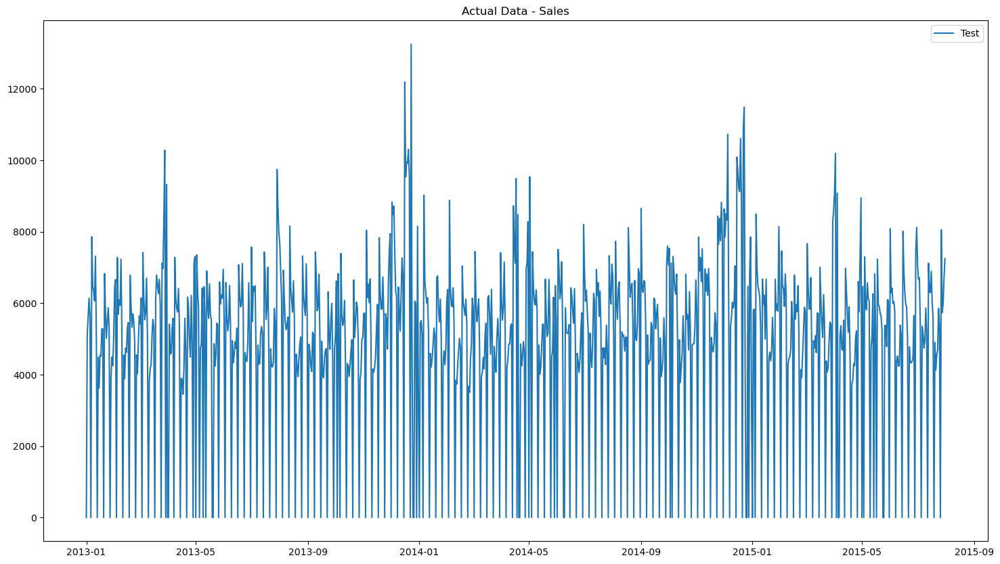

In [490]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store1['Sales'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

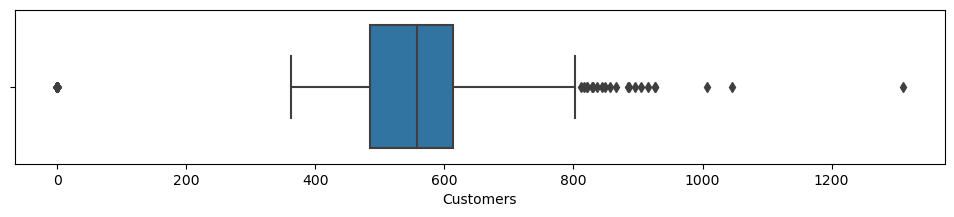

In [491]:
#Outlier Detection
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=store1['Customers'],whis=1.5)

##### Left hand side outliers are zero, we would want the model to capture 0s as the data is 0 here because the store was not open, this is something that the model needs to learn in order to forecast, we need to treat outliers on the right hand side which are skewed

In [492]:
store1.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
count,942.0,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.0,942.0,942.0
mean,31.0,3.997877,4879.132696,487.753715,0.832272,0.382166,0.168790,9800.0,7.0,2012.0
std,0.0,1.998404,2506.671454,234.178009,0.373823,0.486175,0.374765,0.0,0.0,0.0
min,31.0,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,9800.0,7.0,2012.0
25%,31.0,2.000000,4370.250000,485.000000,1.000000,0.000000,0.000000,9800.0,7.0,2012.0
50%,31.0,4.000000,5403.000000,558.000000,1.000000,0.000000,0.000000,9800.0,7.0,2012.0
75%,31.0,6.000000,6316.000000,614.000000,1.000000,1.000000,0.000000,9800.0,7.0,2012.0
max,31.0,7.000000,13252.000000,1310.000000,1.000000,1.000000,1.000000,9800.0,7.0,2012.0


In [493]:
#Replacing the outliers with median values for the Sales & Customer variables, as we can see there are a handful of outliers in the above box plot
ul_sales  = np.mean(store1.Sales) + np.std(store1.Sales) * 1.5
med_sales = np.median(store1.Sales)
ul_cust = np.mean(store1.Customers) + np.std(store1.Customers) * 1.5
med_cust = np.median(store1.Customers)

In [494]:
store1['sales2'] = np.where(store1['Sales']>ul_sales,med_sales,store1['Sales'])
store1['cust2'] = np.where(store1['Customers']>ul_cust,med_cust,store1['Customers'])

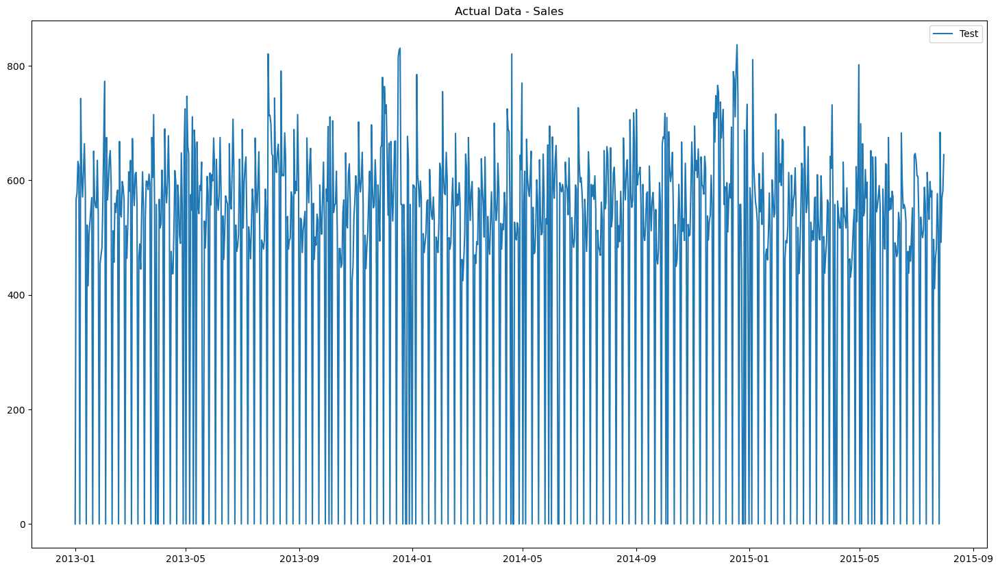

In [495]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store1['cust2'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

In [496]:
store1['SH'] = np.where(store1['StateHoliday']==0, 0, 1)

In [497]:
stationary_check(store1['sales2'])

ADF Statistic: -6.457974
p-value: 0.000000
Critical Values:
1% -3.437485646962348
5% -2.8646901138095378
10% -2.568447319459459


In [498]:
stationary_check(store1['cust2'])

ADF Statistic: -5.585954
p-value: 0.000001
Critical Values:
1% -3.4374778690219956
5% -2.864686684217556
10% -2.5684454926748583


The p-value is very less than the significance level of 0.05 and hence we can reject the null hypothesis and consider that the series is stationary.

In [499]:
store1 = store1.sort_index(ascending = True)

## Split into Train & Test
test_size = 42

df_train = store1[:-test_size]
df_test = store1[-test_size:]

In [500]:
store1['SH'] = np.where(store1['StateHoliday']==0, 0, 1)

In [501]:
#Performing Scaling for the Sales & Customer Variables, Fit & Transform will be applied on the train data, and only trasnform will be applied on the Test Data
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [502]:
df_train[['sales3','cust3']] = scaler.fit_transform(df_train[['sales2','cust2']])

df_train.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,sales2,cust2,SH,sales3,cust3
Date,,,,,,,,,,,,,,,,,,,
2013-01-01,31,2,2013-01-01,0,0,0,0,a,1,d,c,9800.0,7.0,2012.0,0.0,0.0,1,0.000000,0.000000
2013-01-02,31,3,2013-01-02,5122,567,1,0,0,1,d,c,9800.0,7.0,2012.0,5122.0,567.0,1,0.596414,0.677419
2013-01-03,31,4,2013-01-03,5623,578,1,0,0,1,d,c,9800.0,7.0,2012.0,5623.0,578.0,1,0.654751,0.690562
2013-01-04,31,5,2013-01-04,6140,633,1,0,0,1,d,c,9800.0,7.0,2012.0,6140.0,633.0,1,0.714951,0.756272
2013-01-05,31,6,2013-01-05,5607,624,1,0,0,0,d,c,9800.0,7.0,2012.0,5607.0,624.0,1,0.652888,0.745520


In [503]:
df_test[['sales3','cust3']] = scaler.transform(df_test[['sales2','cust2']])

df_test.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,sales2,cust2,SH,sales3,cust3
Date,,,,,,,,,,,,,,,,,,,
2015-06-20,31,6,2015-06-20,5032,528,1,0,0,0,d,c,9800.0,7.0,2012.0,5032.0,528.0,1,0.585934,0.630824
2015-06-21,31,7,2015-06-21,0,0,0,0,0,0,d,c,9800.0,7.0,2012.0,0.0,0.0,1,0.000000,0.000000
2015-06-22,31,1,2015-06-22,4779,476,1,0,0,0,d,c,9800.0,7.0,2012.0,4779.0,476.0,1,0.556474,0.568698
2015-06-23,31,2,2015-06-23,4327,438,1,0,0,0,d,c,9800.0,7.0,2012.0,4327.0,438.0,1,0.503843,0.523297
2015-06-24,31,3,2015-06-24,4338,485,1,0,0,0,d,c,9800.0,7.0,2012.0,4338.0,485.0,1,0.505123,0.579450


In [504]:
exog = df_train[['Promo','Open','DayOfWeek']]
df_train['sales3'] = df_train['sales3'].astype('float64')
df_train['cust3'] = df_train['cust3'].astype('float64')
mod1 = sm.tsa.VARMAX(df_train[['sales3', 'cust3']], order=(1,0), trend='n', exog=exog)
res1 = mod1.fit(maxiter=1000, disp=False)
print(res1.summary())
#Note the AIC value - lower AIC => better model

                            Statespace Model Results                           
Dep. Variable:     ['sales3', 'cust3']   No. Observations:                  900
Model:                         VARX(1)   Log Likelihood                2361.457
Date:                 Wed, 22 Mar 2023   AIC                          -4696.913
Time:                         20:43:13   BIC                          -4634.482
Sample:                     01-01-2013   HQIC                         -4673.064
                          - 06-19-2015                                         
Covariance Type:                   opg                                         
Ljung-Box (L1) (Q):           60.12, 21.28   Jarque-Bera (JB):      499.40, 8319.09
Prob(Q):                        0.00, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         1.19, 1.81   Skew:                       0.50, 2.50
Prob(H) (two-sided):            0.12, 0.00   Kurtosis:                  6.51, 17.03
                        

In [505]:
start_index = df_test.index.min()
end_index = df_test.index.max()
predictions = mod1.fit().predict(start=start_index, end=end_index, exog=df_test[['Promo','Open','DayOfWeek']])

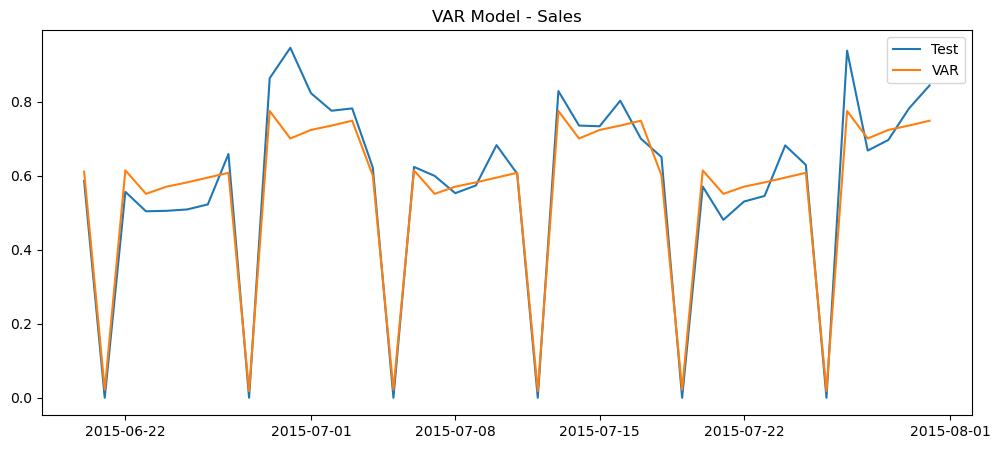

In [506]:
print_graph(df_test['sales3'], predictions['sales3'], 'Test', 'VAR', 'VAR Model - Sales')

In [507]:
output = pd.DataFrame({"Sales(Pred)":predictions['sales3'], "Customers(Pred)":predictions['cust3'],"Sales(Act)":df_test['sales3'], "Customers(Act)":df_test['cust3']})
output.head(10)

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,0.610993,0.650091,0.585934,0.630824
2015-06-21,0.021592,0.021767,0.000000,0.000000
2015-06-22,0.614514,0.668643,0.556474,0.568698
2015-06-23,0.551055,0.620826,0.503843,0.523297
2015-06-24,0.570425,0.642788,0.505123,0.579450
2015-06-25,0.581938,0.653263,0.508850,0.548387
2015-06-26,0.594904,0.664098,0.522473,0.605735
2015-06-27,0.607857,0.674602,0.658593,0.659498
2015-06-28,0.017947,0.026273,0.000000,0.000000
2015-06-29,0.774810,0.778619,0.863531,0.769415


In [508]:
col = ['Sales(Pred)','Customers(Pred)']
output[col] = scaler.inverse_transform(output[col])
output.head()

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,5247.209388,544.126122,0.585934,0.630824
2015-06-21,185.429100,18.218616,0.000000,0.000000
2015-06-22,5277.446535,559.654138,0.556474,0.568698
2015-06-23,4732.461990,519.631638,0.503843,0.523297
2015-06-24,4898.806502,538.013876,0.505123,0.579450


In [509]:
col = ['Sales(Act)','Customers(Act)']
output[col] = scaler.inverse_transform(output[col])
output.head()

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,5247.209388,544.126122,5032.0,528.0
2015-06-21,185.429100,18.218616,0.0,0.0
2015-06-22,5277.446535,559.654138,4779.0,476.0
2015-06-23,4732.461990,519.631638,4327.0,438.0
2015-06-24,4898.806502,538.013876,4338.0,485.0


In [510]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(output['Sales(Pred)'], output['Sales(Act)'])).round(2)
#print('Income: RMSE:',  rmse)

In [511]:
model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VAR'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(output['Customers(Pred)'], output['Customers(Act)'])).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VAR'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

model_comparison.reset_index(drop=True, inplace=True)
model_comparison

,Model,Variable,RMSE
0,VAR,Sales,575.34
1,VAR,Customers,46.75


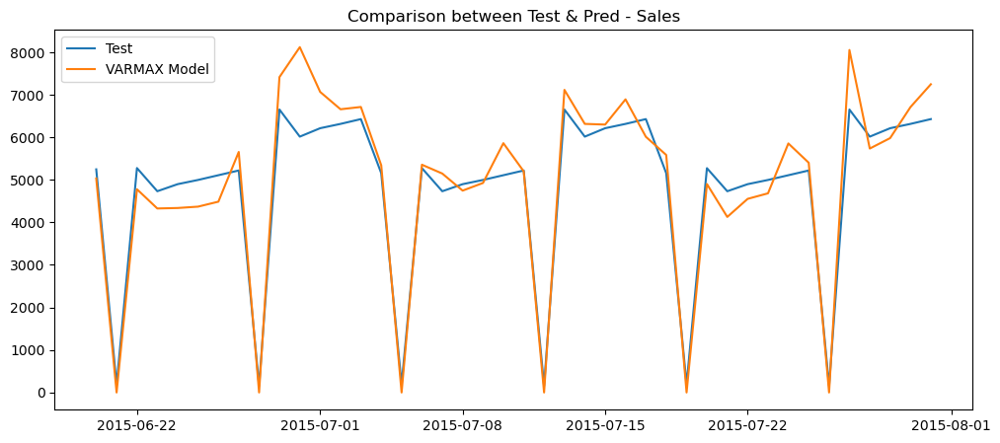

In [512]:
print_graph(output['Sales(Pred)'],output['Sales(Act)'],'Test','VARMAX Model','Comparison between Test & Pred - Sales')

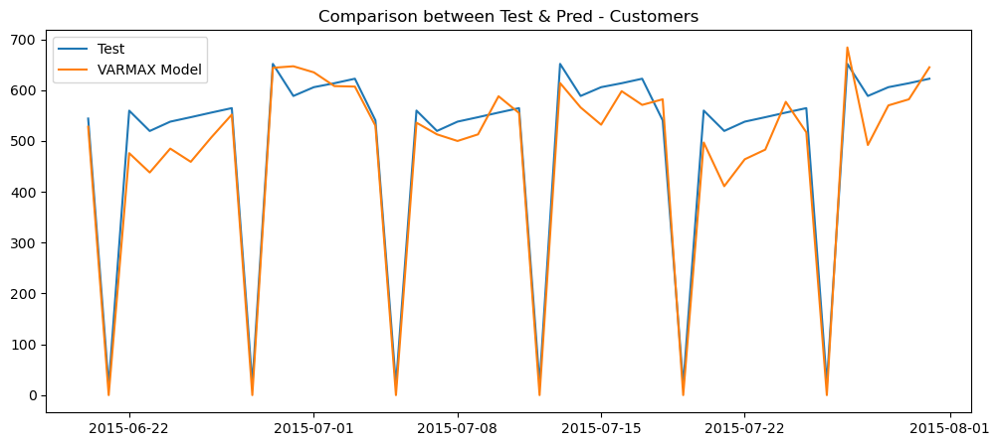

In [513]:
print_graph(output['Customers(Pred)'],output['Customers(Act)'],'Test','VARMAX Model','Comparison between Test & Pred - Customers')

### Store 46

In [649]:
store1 = merged_df[merged_df['Store']==46]
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
45,46,5,2015-07-31,7628,775,1,1,0,0,c,a,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
1160,46,4,2015-07-30,7057,760,1,1,0,0,c,a,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
2275,46,3,2015-07-29,6955,716,1,1,0,0,c,a,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
3390,46,2,2015-07-28,6385,714,1,1,0,0,c,a,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
4505,46,1,2015-07-27,10068,896,1,1,0,0,c,a,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"


In [650]:
store1['Date'] = pd.to_datetime(store1['Date'], format='%Y-%m-%d')
store1.index = store1.Date

In [651]:
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,Promo2,Promo2SinceWeek,Promo2SinceYear,PromoInterval
Date,,,,,,,,,,,,,,,,,,
2015-07-31,46,5,2015-07-31,7628,775,1,1,0,0,c,a,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
2015-07-30,46,4,2015-07-30,7057,760,1,1,0,0,c,a,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
2015-07-29,46,3,2015-07-29,6955,716,1,1,0,0,c,a,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
2015-07-28,46,2,2015-07-28,6385,714,1,1,0,0,c,a,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"
2015-07-27,46,1,2015-07-27,10068,896,1,1,0,0,c,a,1200.0,9.0,2005.0,1,14.0,2011.0,"Jan,Apr,Jul,Oct"


In [652]:
(store1.Date.max() - store1.Date.min())
store1.shape

(758, 18)

In [653]:
#There are no missing days, checking for missing data
store1.isnull().sum()

Store                        0
DayOfWeek                    0
Date                         0
Sales                        0
Customers                    0
Open                         0
Promo                        0
StateHoliday                 0
SchoolHoliday                0
StoreType                    0
Assortment                   0
CompetitionDistance          0
CompetitionOpenSinceMonth    0
CompetitionOpenSinceYear     0
Promo2                       0
Promo2SinceWeek              0
Promo2SinceYear              0
PromoInterval                0
dtype: int64

In [654]:
#As Promo 2 is 0 for Store 1, that means a second promo never existed for this Store, hence removing columns related to Promo2
store1 = store1.drop(['Promo2','Promo2SinceWeek','Promo2SinceYear','PromoInterval'], axis=1)
store1.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
Date,,,,,,,,,,,,,,
2015-07-31,46,5,2015-07-31,7628,775,1,1,0,0,c,a,1200.0,9.0,2005.0
2015-07-30,46,4,2015-07-30,7057,760,1,1,0,0,c,a,1200.0,9.0,2005.0
2015-07-29,46,3,2015-07-29,6955,716,1,1,0,0,c,a,1200.0,9.0,2005.0
2015-07-28,46,2,2015-07-28,6385,714,1,1,0,0,c,a,1200.0,9.0,2005.0
2015-07-27,46,1,2015-07-27,10068,896,1,1,0,0,c,a,1200.0,9.0,2005.0


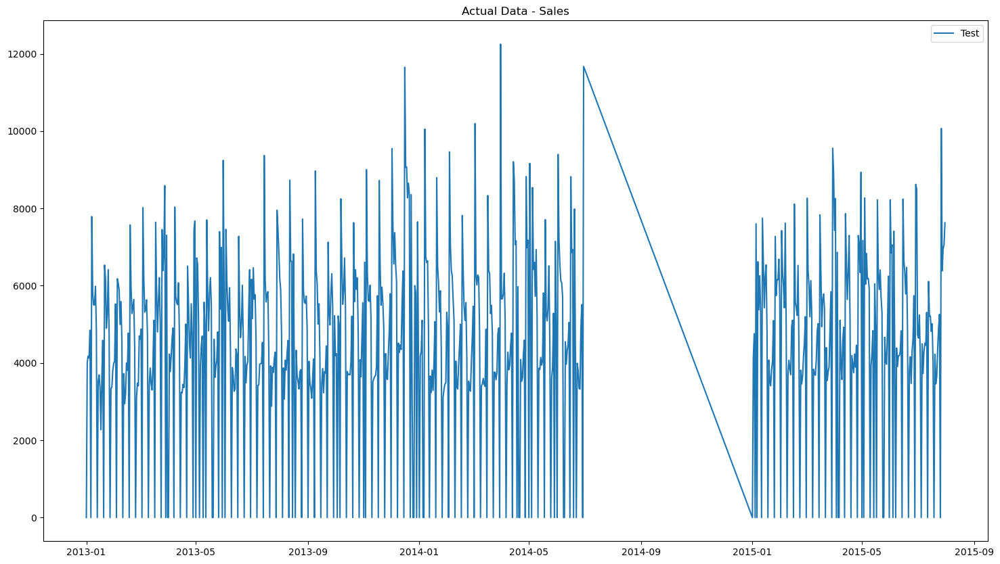

In [655]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store1['Sales'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

#### Data is missing for few dates, hence marking it as 0

In [658]:
new_date_range = pd.date_range(start="2014-07-01", end="2014-12-31", freq="D")
abc = store1.reindex(new_date_range, fill_value=0)

In [659]:
abc.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
count,184.0,184.0,184.0,184.0,184.0,184.0,184.0,184.0,184.0,184.0
mean,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
std,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
min,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
25%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
50%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
75%,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
max,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [660]:
store2 = pd.concat([store1, abc])
store2.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
2015-07-31,46,5,2015-07-31 00:00:00,7628,775,1,1,0,0,c,a,1200.0,9.0,2005.0
2015-07-30,46,4,2015-07-30 00:00:00,7057,760,1,1,0,0,c,a,1200.0,9.0,2005.0
2015-07-29,46,3,2015-07-29 00:00:00,6955,716,1,1,0,0,c,a,1200.0,9.0,2005.0
2015-07-28,46,2,2015-07-28 00:00:00,6385,714,1,1,0,0,c,a,1200.0,9.0,2005.0
2015-07-27,46,1,2015-07-27 00:00:00,10068,896,1,1,0,0,c,a,1200.0,9.0,2005.0


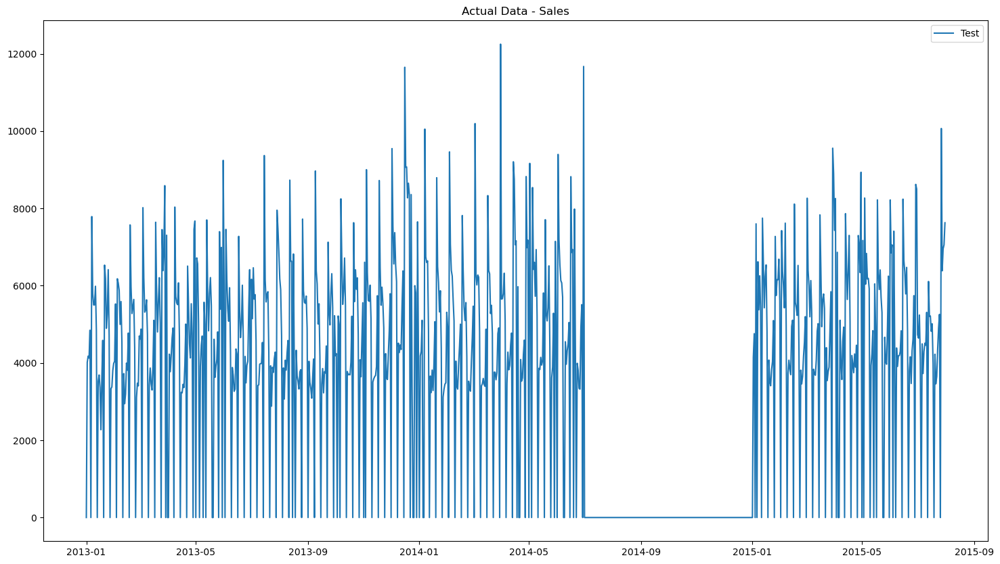

In [664]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store2['Sales'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

In [663]:
store2 = store2.sort_index(ascending = True)

In [665]:
store1 = store2

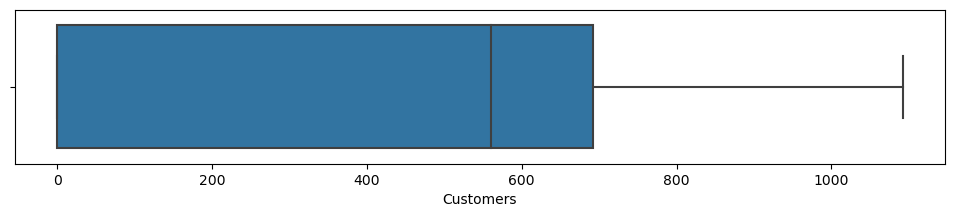

In [666]:
#Outlier Detection
import seaborn as sns
fig = plt.subplots(figsize=(12, 2))
ax = sns.boxplot(x=store1['Customers'],whis=1.5)

##### Left hand side outliers are zero, we would want the model to capture 0s as the data is 0 here because the store was not open, this is something that the model needs to learn in order to forecast, we need to treat outliers on the right hand side which are skewed

In [667]:
store1.describe()

,Store,DayOfWeek,Sales,Customers,Open,Promo,SchoolHoliday,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear
count,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.000000,942.00000
mean,37.014862,3.219745,3534.102972,436.127389,0.660297,0.303609,0.131635,965.605096,7.242038,1613.36518
std,18.246564,2.394537,2842.069689,327.729935,0.473860,0.460060,0.338273,475.997309,3.569980,795.31217
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000
25%,46.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1200.000000,9.000000,2005.00000
50%,46.000000,3.000000,4043.000000,560.000000,1.000000,0.000000,0.000000,1200.000000,9.000000,2005.00000
75%,46.000000,5.000000,5612.250000,691.750000,1.000000,1.000000,0.000000,1200.000000,9.000000,2005.00000
max,46.000000,7.000000,12250.000000,1092.000000,1.000000,1.000000,1.000000,1200.000000,9.000000,2005.00000


In [668]:
#Replacing the outliers with median values for the Sales & Customer variables, as we can see there are a handful of outliers in the above box plot
ul_sales  = np.mean(store1.Sales) + np.std(store1.Sales) * 1.5
med_sales = np.median(store1.Sales)
ul_cust = np.mean(store1.Customers) + np.std(store1.Customers) * 1.5
med_cust = np.median(store1.Customers)

In [669]:
store1['sales2'] = np.where(store1['Sales']>ul_sales,med_sales,store1['Sales'])
store1['cust2'] = np.where(store1['Customers']>ul_cust,med_cust,store1['Customers'])

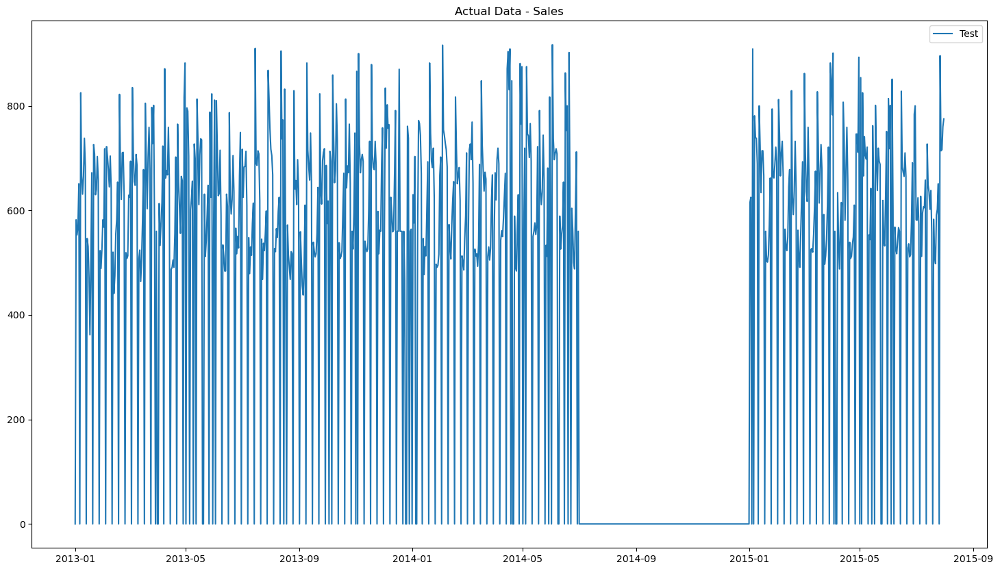

In [670]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store1['cust2'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

We see that the data is missing for almost 6 months, between 2014 Jul to Dec, this maybe due to the shop getting closed and maybe being under renovation, hence going ahead with filling these values as 0 to indicate this to the model

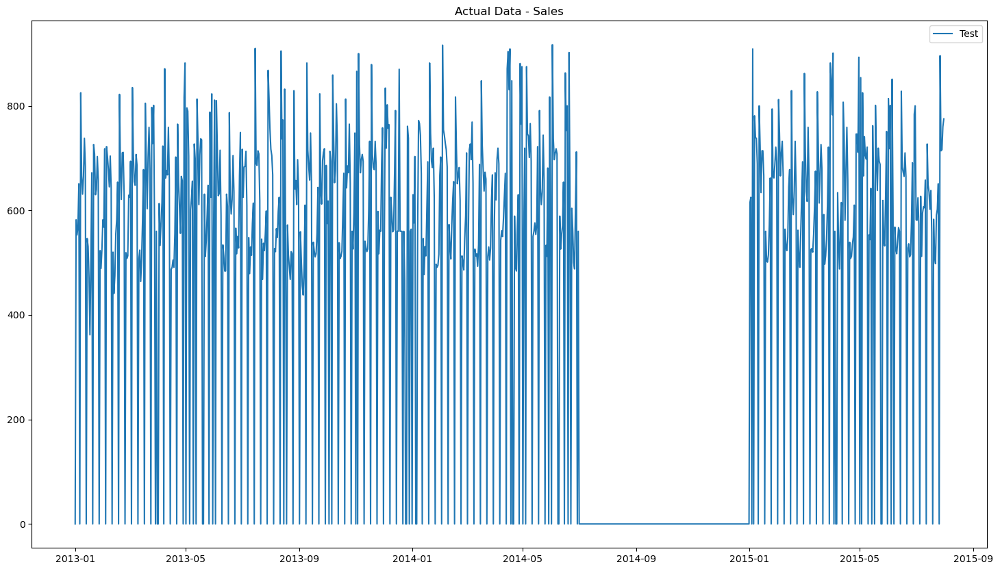

In [690]:
plt.figure(figsize=(18,10)) 
#plt.plot( df_train['Sales'], label='Train')
plt.plot(store2['cust2'], label='Test')
plt.legend(loc='best')
plt.title('Actual Data - Sales')
plt.show()

In [672]:
store1['SH'] = np.where(store1['StateHoliday']==0, 0, 1)

In [673]:
stationary_check(store1['sales2'])

ADF Statistic: -1.735018
p-value: 0.413167
Critical Values:
1% -3.4374778690219956
5% -2.864686684217556
10% -2.5684454926748583


In [674]:
stationary_check(store1['cust2'])

ADF Statistic: -1.743407
p-value: 0.408898
Critical Values:
1% -3.437485646962348
5% -2.8646901138095378
10% -2.568447319459459


The p-value is very less than the significance level of 0.05 and hence we can reject the null hypothesis and consider that the series is stationary.

In [675]:
store1 = store1.sort_index(ascending = True)

## Split into Train & Test
test_size = 42

df_train = store1[:-test_size]
df_test = store1[-test_size:]

In [676]:
store1['SH'] = np.where(store1['StateHoliday']==0, 0, 1)

In [677]:
#Performing Scaling for the Sales & Customer Variables, Fit & Transform will be applied on the train data, and only trasnform will be applied on the Test Data
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler()

In [678]:
df_train[['sales3','cust3']] = scaler.fit_transform(df_train[['sales2','cust2']])

df_train.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,sales2,cust2,SH,sales3,cust3
2013-01-01,46,2,2013-01-01 00:00:00,0,0,0,0,a,1,c,a,1200.0,9.0,2005.0,0.0,0.0,1,0.000000,0.000000
2013-01-02,46,3,2013-01-02 00:00:00,4016,582,1,0,0,1,c,a,1200.0,9.0,2005.0,4016.0,582.0,1,0.515665,0.634678
2013-01-03,46,4,2013-01-03 00:00:00,4177,553,1,0,0,1,c,a,1200.0,9.0,2005.0,4177.0,553.0,1,0.536338,0.603053
2013-01-04,46,5,2013-01-04 00:00:00,4125,569,1,0,0,1,c,a,1200.0,9.0,2005.0,4125.0,569.0,1,0.529661,0.620502
2013-01-05,46,6,2013-01-05 00:00:00,4848,651,1,0,0,0,c,a,1200.0,9.0,2005.0,4848.0,651.0,1,0.622496,0.709924


In [679]:
df_test[['sales3','cust3']] = scaler.transform(df_test[['sales2','cust2']])

df_test.head()

,Store,DayOfWeek,Date,Sales,Customers,Open,Promo,StateHoliday,SchoolHoliday,StoreType,Assortment,CompetitionDistance,CompetitionOpenSinceMonth,CompetitionOpenSinceYear,sales2,cust2,SH,sales3,cust3
2015-06-20,46,6,2015-06-20 00:00:00,4812,665,1,0,0,0,c,a,1200.0,9.0,2005.0,4812.0,665.0,1,0.617874,0.725191
2015-06-21,46,7,2015-06-21 00:00:00,0,0,0,0,0,0,c,a,1200.0,9.0,2005.0,0.0,0.0,1,0.000000,0.000000
2015-06-22,46,1,2015-06-22 00:00:00,3792,528,1,0,0,0,c,a,1200.0,9.0,2005.0,3792.0,528.0,1,0.486903,0.575791
2015-06-23,46,2,2015-06-23 00:00:00,4160,536,1,0,0,0,c,a,1200.0,9.0,2005.0,4160.0,536.0,1,0.534155,0.584515
2015-06-24,46,3,2015-06-24 00:00:00,3469,511,1,0,0,0,c,a,1200.0,9.0,2005.0,3469.0,511.0,1,0.445429,0.557252


In [680]:
exog = df_train[['Promo','Open','DayOfWeek']]
df_train['sales3'] = df_train['sales3'].astype('float64')
df_train['cust3'] = df_train['cust3'].astype('float64')
mod1 = sm.tsa.VARMAX(df_train[['sales3', 'cust3']], order=(1,0), trend='n', exog=exog)
res1 = mod1.fit(maxiter=1000, disp=False)
print(res1.summary())
#Note the AIC value - lower AIC => better model

                            Statespace Model Results                           
Dep. Variable:     ['sales3', 'cust3']   No. Observations:                  900
Model:                         VARX(1)   Log Likelihood                2036.347
Date:                 Wed, 22 Mar 2023   AIC                          -4046.694
Time:                         22:05:55   BIC                          -3984.263
Sample:                     01-01-2013   HQIC                         -4022.845
                          - 06-19-2015                                         
Covariance Type:                   opg                                         
Ljung-Box (L1) (Q):            2.92, 12.30   Jarque-Bera (JB):      187.73, 2333.97
Prob(Q):                        0.09, 0.00   Prob(JB):                   0.00, 0.00
Heteroskedasticity (H):         0.63, 0.72   Skew:                       0.18, 1.07
Prob(H) (two-sided):            0.00, 0.00   Kurtosis:                  5.21, 10.60
                        

In [681]:
start_index = df_test.index.min()
end_index = df_test.index.max()
predictions = mod1.fit().predict(start=start_index, end=end_index, exog=df_test[['Promo','Open','DayOfWeek']])

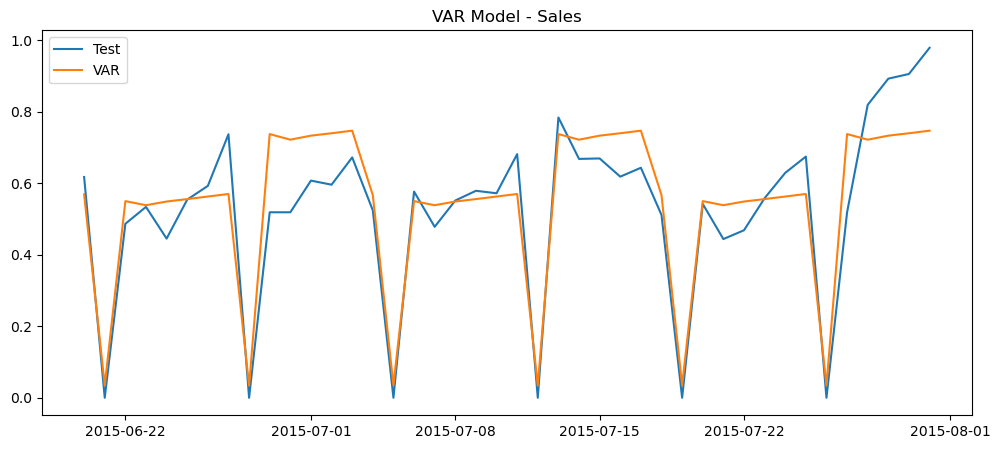

In [682]:
print_graph(df_test['sales3'], predictions['sales3'], 'Test', 'VAR', 'VAR Model - Sales')

In [683]:
output = pd.DataFrame({"Sales(Pred)":predictions['sales3'], "Customers(Pred)":predictions['cust3'],"Sales(Act)":df_test['sales3'], "Customers(Act)":df_test['cust3']})
output.head(10)

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,0.569370,0.638884,0.617874,0.725191
2015-06-21,0.035050,0.030401,0.000000,0.000000
2015-06-22,0.550303,0.660346,0.486903,0.575791
2015-06-23,0.538907,0.596401,0.534155,0.584515
2015-06-24,0.549211,0.619044,0.445429,0.557252
2015-06-25,0.556029,0.632758,0.554571,0.561614
2015-06-26,0.563185,0.647446,0.592964,0.630316
2015-06-27,0.570304,0.662030,0.737417,0.753544
2015-06-28,0.034032,0.028222,0.000000,0.000000
2015-06-29,0.737970,0.829380,0.519132,0.854962


In [684]:
col = ['Sales(Pred)','Customers(Pred)']
output[col] = scaler.inverse_transform(output[col])
output.head()

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,4434.253572,585.856706,0.617874,0.725191
2015-06-21,272.967485,27.877362,0.000000,0.000000
2015-06-22,4285.758089,605.537144,0.486903,0.575791
2015-06-23,4197.010339,546.899923,0.534155,0.584515
2015-06-24,4277.254517,567.663032,0.445429,0.557252


In [685]:
col = ['Sales(Act)','Customers(Act)']
output[col] = scaler.inverse_transform(output[col])
output.head()

,Sales(Pred),Customers(Pred),Sales(Act),Customers(Act)
2015-06-20,4434.253572,585.856706,4812.0,665.0
2015-06-21,272.967485,27.877362,0.0,0.0
2015-06-22,4285.758089,605.537144,3792.0,528.0
2015-06-23,4197.010339,546.899923,4160.0,536.0
2015-06-24,4277.254517,567.663032,3469.0,511.0


In [686]:
# Root Mean Square Error (RMSE)
rmse = np.sqrt(mean_squared_error(output['Sales(Pred)'], output['Sales(Act)'])).round(2)
#print('Income: RMSE:',  rmse)

In [687]:
model_comparison=pd.DataFrame()
model_comparison.loc[0,'Model']='VAR'
model_comparison.loc[0,'Variable']='Sales'
model_comparison.loc[0,'RMSE']=rmse

rmse = np.sqrt(mean_squared_error(output['Customers(Pred)'], output['Customers(Act)'])).round(2)
#print('Investment: RMSE:',  rmse)

append=pd.DataFrame()
append.loc[0,'Model']='VAR'
append.loc[0,'Variable']='Customers'
append.loc[0,'RMSE']=rmse

model_comparison = model_comparison.append(append)

model_comparison.reset_index(drop=True, inplace=True)
model_comparison

,Model,Variable,RMSE
0,VAR,Sales,793.89
1,VAR,Customers,61.20


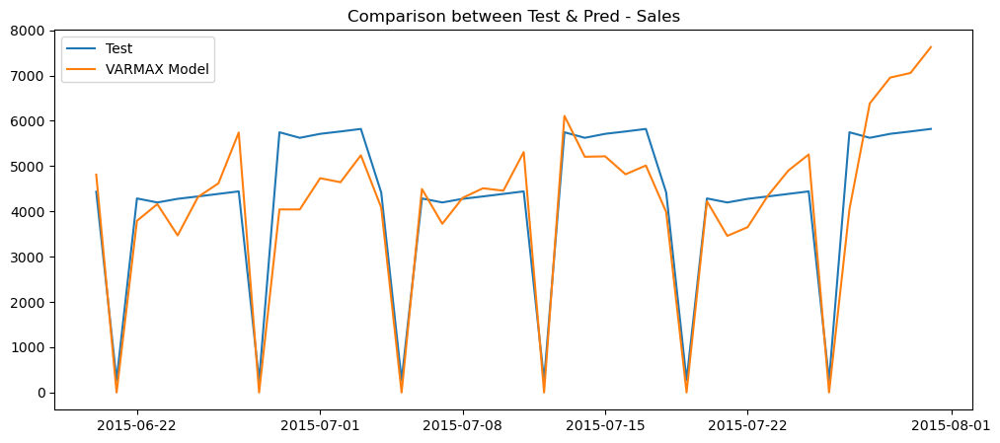

In [688]:
print_graph(output['Sales(Pred)'],output['Sales(Act)'],'Test','VARMAX Model','Comparison between Test & Pred - Sales')

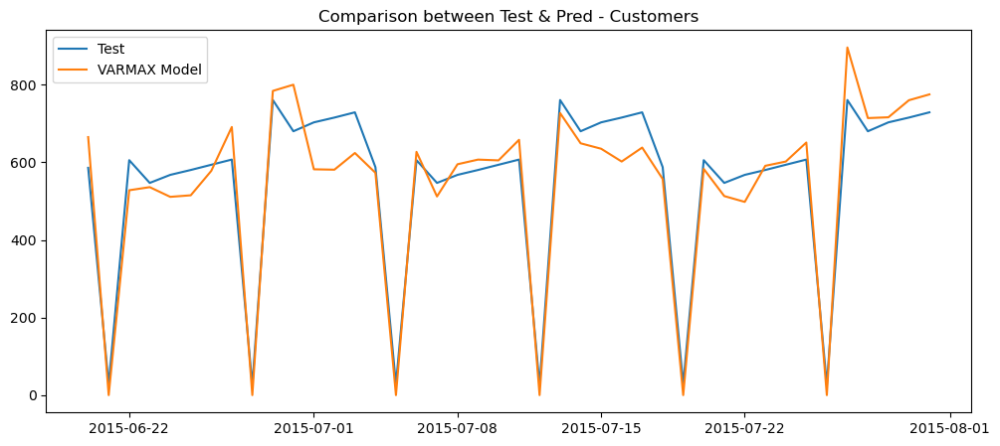

In [689]:
print_graph(output['Customers(Pred)'],output['Customers(Act)'],'Test','VARMAX Model','Comparison between Test & Pred - Customers')